In [ ]:
import pandas as pd
import seaborn as sns
import glob
import os
import json

import warnings
warnings.filterwarnings("ignore")

from IPython.display import clear_output 

pd.set_option('display.max_columns', None)
#pd.set_option('display.max_rows', None)
pd.set_option('display.float_format', lambda x: '%.2f' % x)

import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Data processing

## CBG level lat & lon

**nyc only ... this data comes from the notebook 4_VisitorCBG_Extract_LatLon_from_Shapefile.ipynb**

In [ ]:
# nyc only ... this data comes from the notebook 4_VisitorCBG_Extract_LatLon_from_Shapefile.ipynb
cbg_latlon = pd.read_csv('/content/drive/MyDrive/Safegraph-research/shapefiles/cbg_latlong_from_shapefile.csv',
                          dtype={'geoid': 'object',
                                'v_countyfips': 'object'}
                )
cbg_latlon.dtypes

geoid            object
v_countyfips     object
lat             float64
lon             float64
geometry         object
dtype: object

In [ ]:
cbg_latlon.nunique()

geoid           6807
v_countyfips       5
lat             6800
lon             6795
geometry        6807
dtype: int64

In [ ]:
cbg_latlon.head(1)

,geoid,v_countyfips,lat,lon,geometry
0,360610239001,36061,40.83,-73.94,"POLYGON ((-73.941118 40.831655999999995, -73.9..."


In [ ]:
cbg_latlon.columns = ['geoid', 'v_countyfips', 'v_lat', 'v_lon', 'v_geometry']
cbg_latlon.head(1)

,geoid,v_countyfips,v_lat,v_lon,v_geometry
0,360610239001,36061,40.83,-73.94,"POLYGON ((-73.941118 40.831655999999995, -73.9..."


## Demographics data

For details, review **CensusData_MountSinai_Profiling.ipynb**

**safegraph_demo_profile**

[This](https://github.com/ryanfoxsquire/safegraph_demo_profile) is a python module of helper functions for performing demographic analysis with SafeGraph data

To see these functions in action, check out [this demonstration notebook](https://colab.research.google.com/drive/13BmucZMu0-UFNnVKoJP4ZuJpGNyQXLln#offline=true&sandboxMode=true).


In [ ]:
! pip install -q --upgrade git+https://github.com/ryanfoxsquire/safegraph_demo_profile
from demo_profile_functions import demo_profile_functions as dpf

In [ ]:
import sys
sys.path.append('/content/drive/MyDrive/Safegraph-research/safegraph_demo_profile/profile_functions/')

import profile_functions as dpf

**(American Census Data) ACS data**

In [ ]:
open_census_dir = "/content/drive/MyDrive/Safegraph-research/OpenCensusData/"
open_census_dir

'/content/drive/MyDrive/Safegraph-research/OpenCensusData/'

In [ ]:
demographic_options = {'Sex By Age': True, # Select True for which dimensions you want to analyze
                       'Race' : True,
                       'Hispanic Or Latino Origin': True,
                       'Educational Attainment For The Population 25 Years And Over': True, 
                       'Household Income In The Past 12 Months': True
                        }

census_year = 2019 # can be modified to 2018 as well
demos_to_analyze = [demo for demo, to_use in demographic_options.items() if to_use]
census_df, cbg_field_desc_mod = dpf.get_census_master(demos_to_analyze,
                                                      census_year,
                                                      open_census_dir)

census_df[['census_block_group'] + list(census_df.columns)].head()

Pulling census data from /content/drive/MyDrive/Safegraph-research/OpenCensusData/ for:
Sex By Age
Race
Hispanic Or Latino Origin
Educational Attainment For The Population 25 Years And Over
Household Income In The Past 12 Months
Starting reaggregations (this is a slow step).
census data starting shape: 
(220333, 921)
Education aggregation complete.
(220333, 902)
Age aggregation complete.
(220333, 865)
Income aggregation complete.
(220333, 852)
Race aggregation complete.
(220333, 852)
Hispanic Or Latino aggregation complete.
(220333, 852)
Dropped unused columns.
(220333, 22)
Added normalized columns as fractions.
(220333, 42)


,census_block_group,B01P1529,B01P3049,B01P50ov,B02001e2,B02001e3,B02001e4,B02001e5,B02001e6,B02001e7,B02001e8,B03003e3,B03003e2,B15003aa,B15003bb,B15003cc,B15003dd,B15003ee,B19xxx59,B1960x99,B19100xx,census_block_group,B01001e1,B01P1529_frac,B01P3049_frac,B01P50ov_frac,B02001e2_frac,B02001e3_frac,B02001e4_frac,B02001e5_frac,B02001e6_frac,B02001e7_frac,B02001e8_frac,B03003e3_frac,B03003e2_frac,B15003aa_frac,B15003bb_frac,B15003cc_frac,B15003dd_frac,B15003ee_frac,B19xxx59_frac,B1960x99_frac,B19100xx_frac
0,010010201001,156,176,325,613,60,0,0,0,0,57,7,723,106,187,126,41,50,206,55,54,010010201001,730,0.24,0.27,0.49,0.84,0.08,0.00,0.00,0.00,0.00,0.08,0.01,0.99,0.21,0.37,0.25,0.08,0.10,0.65,0.17,0.17
1,010010201002,221,325,442,1072,92,0,2,0,0,97,19,1244,60,276,209,164,104,146,121,127,010010201002,1263,0.22,0.33,0.45,0.85,0.07,0.00,0.00,0.00,0.00,0.08,0.02,0.98,0.07,0.34,0.26,0.20,0.13,0.37,0.31,0.32
2,010010202001,157,210,290,276,507,0,0,21,0,31,30,805,68,309,114,46,6,242,55,21,010010202001,835,0.24,0.32,0.44,0.33,0.61,0.00,0.00,0.03,0.00,0.04,0.04,0.96,0.13,0.57,0.21,0.08,0.01,0.76,0.17,0.07
3,010010202002,227,390,363,483,610,0,0,0,6,25,0,1124,140,337,195,138,50,224,70,76,010010202002,1124,0.23,0.40,0.37,0.43,0.54,0.00,0.00,0.00,0.01,0.02,0.00,1.00,0.16,0.39,0.23,0.16,0.06,0.61,0.19,0.21
4,010010203001,476,809,956,1866,557,0,32,5,233,81,233,2541,254,736,625,204,191,521,288,217,010010203001,2774,0.21,0.36,0.43,0.67,0.20,0.00,0.01,0.00,0.08,0.03,0.08,0.92,0.13,0.37,0.31,0.10,0.10,0.51,0.28,0.21


In [ ]:
spike_cols = [col for col in census_df.columns if 'B01001e1' in col]
print(list(census_df.columns))
print(spike_cols)

['B01P1529', 'B01P3049', 'B01P50ov', 'B02001e2', 'B02001e3', 'B02001e4', 'B02001e5', 'B02001e6', 'B02001e7', 'B02001e8', 'B03003e3', 'B03003e2', 'B15003aa', 'B15003bb', 'B15003cc', 'B15003dd', 'B15003ee', 'B19xxx59', 'B1960x99', 'B19100xx', 'census_block_group', 'B01001e1', 'B01P1529_frac', 'B01P3049_frac', 'B01P50ov_frac', 'B02001e2_frac', 'B02001e3_frac', 'B02001e4_frac', 'B02001e5_frac', 'B02001e6_frac', 'B02001e7_frac', 'B02001e8_frac', 'B03003e3_frac', 'B03003e2_frac', 'B15003aa_frac', 'B15003bb_frac', 'B15003cc_frac', 'B15003dd_frac', 'B15003ee_frac', 'B19xxx59_frac', 'B1960x99_frac', 'B19100xx_frac']
['B01001e1']


In [ ]:
print(census_df.shape)

(220333, 42)


In [ ]:
census_df['census_block_group'].nunique()

220333

In [ ]:
cbg_latlon.sample(5)

,geoid,v_countyfips,v_lat,v_lon,v_geometry
6394,360810892021,36081,40.65,-73.85,"POLYGON ((-73.860483 40.654658999999995, -73.8..."
5494,360470236004,36047,40.63,-73.99,"POLYGON ((-73.99212 40.635025999999996, -73.98..."
4500,360470488002,36047,40.64,-73.98,POLYGON ((-73.97779799999999 40.64045499999999...
1712,360850189022,36085,40.61,-74.14,"POLYGON ((-74.140901 40.607786999999995, -74.1..."
6168,360610056002,36061,40.74,-73.99,"POLYGON ((-73.989576 40.741548, -73.989318 40...."


In [ ]:
cbg_latlon.isnull().sum()

geoid           0
v_countyfips    0
v_lat           0
v_lon           0
v_geometry      0
dtype: int64

In [ ]:
#cbg_latlon = cbg_latlon.merge(census_df,
#                             how='left',
#                             left_on = 'geoid',
#                             right_on = 'census_block_group'
#                             )

#len(cbg_latlon)

## Hospital data

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Safegraph-research/nyc-data/nyc_0218.csv',
                 dtype={'brands': 'object',
                'closed_on': 'object',
                'postal_code': 'object',
                'countyfips': 'object',
                'opened_on': 'object',
                'safegraph_brand_ids': 'object',    
                'poi_cbg': 'object'})
df.head(2)

,date_range_start,placekey,location_name,brands,latitude,longitude,region,postal_code,iso_country_code,opened_on,closed_on,tracking_closed_since,raw_visit_counts,raw_visitor_counts,visits_by_day,visitor_home_cbgs,visitor_country_of_origin,distance_from_home,median_dwell,bucketed_dwell_times,related_same_day_brand,related_same_week_brand,related_same_day_brand.1,poi_cbg,visitor_home_aggregation,visitor_daytime_cbgs,countyfips,year,month
0,2019-01-07,224-223@627-s8j-tsq,New York University Langone Medical Center,NaN,40.74,-73.97,NY,10016,US,NaN,NaN,2019-07-01,71.00,42.00,"[5,18,16,10,16,5,1]","{""360470098004"":4,""360610285002"":4,""3605952180...","{""US"":39}",7.73,231.00,"{""<5"":1,""5-10"":4,""11-20"":1,""21-60"":8,""61-120"":...","{""Starbucks"":4,""Dunkin'"":4,""Blink Fitness"":3,""...","{""Starbucks"":14,""Dunkin'"":10,""Walmart"":7,""Targ...","{""Starbucks"":4,""Dunkin'"":4,""Blink Fitness"":3,""...",360610062001,"{""36081032800"":4,""36047001500"":4,""36085024700""...","{""360610062001"":11,""360470050002"":4,""360470015...",36061,2019,1
1,2019-01-07,zzw-222@627-s8s-2zf,Kofinas Fertility Group,NaN,40.77,-73.98,NY,10023,US,NaN,NaN,2019-07-01,46.00,38.00,"[3,9,4,16,2,7,5]","{""360610132004"":4,""360595182041"":4,""3606101490...","{""US"":29,""TZ"":4}",8.07,9.50,"{""<5"":5,""5-10"":20,""11-20"":5,""21-60"":6,""61-120""...","{""Starbucks"":10,""Flywheel"":5,""Le Pain Quotidie...","{""Starbucks"":26,""McDonald's"":24,""CVS"":13,""Dunk...","{""Starbucks"":10,""Flywheel"":5,""Le Pain Quotidie...",360610149002,"{""36047043600"":4,""36061019300"":4,""36081015802""...","{""360610149003"":4,""360050221013"":4,""3606101550...",36061,2019,1


In [ ]:
print("Note: each row is a unique Point of Interest (POI) \nand every POI has a unique placekey.\n")

print("number of rows:")
print(df.shape[0]) 
print("number of unique sgpids:")
print(df.placekey.unique().shape[0]) 
print('\n')

Note: each row is a unique Point of Interest (POI) 
and every POI has a unique placekey.

number of rows:
324718
number of unique sgpids:
7126




In [ ]:
df['countyfips'].unique()

array(['36061', '36085', '36047', '36005', '36081'], dtype=object)

## Distance function

In [ ]:
from IPython.core.display import clear_output
!pip install git+https://github.com/MartinThoma/mpu.git
clear_output()

In [ ]:
# https://stackoverflow.com/questions/52292765/how-to-calculate-distance-between-two-zips
import mpu
def calculate_distance(v_location, h_location):        
    v_zip = v_location
    h_zip = h_location
    dist =round(mpu.haversine_distance(v_zip,h_zip),2) # distance in kms    
    # convert km to miles (conversion factor)
    conv_fac = 0.621371
    dist = dist * conv_fac
    return dist

## Explode

In [ ]:
!pip install -q --upgrade git+https://github.com/SafeGraphInc/safegraph_py

In [ ]:
from safegraph_py_functions import safegraph_py_functions as sgpy

In [ ]:
def explode_vertically(df):
    df_visitor_home_cbgs = df[['placekey', 'visitor_home_cbgs','raw_visit_counts','raw_visitor_counts','brands']]
    df_visitor_home_cbgs = df_visitor_home_cbgs[df_visitor_home_cbgs.visitor_home_cbgs.notnull()]
    print(" # of rows in the original data", len(df_visitor_home_cbgs))

    pddf = df_visitor_home_cbgs
    exploded_df = sgpy.unpack_json_fast(pddf, 
                                  json_column='visitor_home_cbgs', 
                                  index_name= 'placekey', 
                                  key_col_name='visitor_home_cbg',
                                  value_col_name='raw_visit_counts')

    print(" # of rows in the exploded data", len(exploded_df))
    print(pddf['placekey'].nunique())
    print(" # of visitors in the dataset", exploded_df['raw_visit_counts'].sum())
    print(" # of unique placekeys in the dataset", exploded_df['placekey'].nunique())

    exploded_df = exploded_df.reset_index(drop=True)
    print(" # of rows in the exploded data", len(exploded_df))

    # Repeating exploded_df based on raw_visit_counts
    exploded_df = exploded_df.reindex(exploded_df.index.repeat(exploded_df.raw_visit_counts))
    print(" # of rows in the exploded repeat data", len(exploded_df))

    # remove Canadian data
    # exclude Canadian CBGs
    exploded_df = exploded_df[~exploded_df['visitor_home_cbg'].str.contains("[A-Za-z]")]
    print(" # of rows after removing Candadian CBGs from the exploded data", len(exploded_df)) 

    exploded_df_w_cbglatlon = exploded_df.merge(cbg_latlon, 
                                            how='left', 
                                            left_on='visitor_home_cbg',
                                            right_on='geoid')
    print(" # of rows in the exploded_df_w_cbglatlon", len(exploded_df_w_cbglatlon)) 

    exploded_df_w_cbglatlon = exploded_df_w_cbglatlon[exploded_df_w_cbglatlon['geoid'].notna()]

    # it appears NYC (5 counties) has 5821 CBGs.
    nyc_cbgs = list(exploded_df_w_cbglatlon['geoid'].unique())

    exploded_df_w_cbglatlon = exploded_df_w_cbglatlon[exploded_df_w_cbglatlon['geoid'].isin(nyc_cbgs)]
    print(" # of rows in the exploded_df_w_cbglatlon", len(exploded_df_w_cbglatlon)) 
    print(exploded_df_w_cbglatlon[['visitor_home_cbg','geoid']].nunique())

    df_geo = df[['placekey', 'location_name',	'brands', 'latitude','longitude','region',
             'postal_code','distance_from_home','poi_cbg']]
    df_geo.columns = ['placekey', 'location_name',	'brands', 'h_latitude','h_longitude','h_region', 'h_postal_code','distance_from_home','h_poicbg']
    print(" # of rows in df_geo", len(df_geo))

    df_geo_no_duplicates = df_geo.drop_duplicates(subset=['placekey','h_latitude'], keep="last")
    print(" # of rows in df_geo_no_duplicates", len(df_geo_no_duplicates))

    print(" # of unique placekeys in df_geo_no_duplicates", df_geo_no_duplicates['placekey'].nunique())

    exploded_df_merged_with_df = exploded_df_w_cbglatlon.merge(df_geo_no_duplicates, how='left', on='placekey')
    print(" # of rows in exploded_df_merged_with_df", len(exploded_df_merged_with_df))

    # convert h_poicbg's data type to string
    exploded_df_merged_with_df['h_poicbg'] = exploded_df_merged_with_df['h_poicbg'].astype('str')

    #exploded_df_merged_with_df.columns = ['placekey', 'visitor_home_cbg', 'raw_visit_counts', 'geoid',
    #      'v_countyfips', 'v_lat', 'v_lon', 'v_geometry', 'location_name', 'brands',
    #      'h_latitude', 'h_longitude', 'h_region', 'h_postal_code',
    #      'distance_from_home', 'h_poicbg']
    print(" # of rows in exploded_df_merged_with_df", len(exploded_df_merged_with_df))

    # zipping h_lat and h_lon
    exploded_df_merged_with_df['h_coor'] = list(zip(exploded_df_merged_with_df.h_latitude, 
                                                  exploded_df_merged_with_df.h_longitude))

    # zipping v_lat and v_lon
    exploded_df_merged_with_df['v_coor'] = list(zip(exploded_df_merged_with_df.v_lat, 
                                                  exploded_df_merged_with_df.v_lon))

    # calculating distance (may take long)
    exploded_df_merged_with_df['distance'] = exploded_df_merged_with_df.apply(lambda row : 
                                                                                calculate_distance(row['v_coor'],
                                                                                row['h_coor']), axis = 1)

    print(" # of rows in the exploded_df_merged_with_df", len(exploded_df_merged_with_df))
      #  # Date YYYY-MM
  
    # exploded_df_merged_with_df_cc['date'] = exploded_df_merged_with_df['date_range_start'][:7]

    # # Closed
    # exploded_df_merged_with_df_cc['closed_date'] = exploded_df_merged_with_df['closed_on']

    # print(exploded_df_merged_with_df.columns)

    # freeing up exploded_df, exploded_df_merged_with_df 
    #del exploded_df
    #del exploded_df_merged_with_df
 
    return exploded_df_merged_with_df

# Select your data and pass it to the explode function

In [ ]:
df['date_range_start'] = pd.to_datetime(df['date_range_start'])
df = df.set_index('date_range_start')  # taking long
df = df.sort_index()

In [ ]:
dfselected = df.loc['2020-04']   # 2020 April
#dfselected = df
dfselected = dfselected.reset_index()
print(len(dfselected))

5401


In [ ]:
dfselected.head(1)

,date_range_start,placekey,location_name,brands,latitude,longitude,region,postal_code,iso_country_code,opened_on,closed_on,tracking_closed_since,raw_visit_counts,raw_visitor_counts,visits_by_day,visitor_home_cbgs,visitor_country_of_origin,distance_from_home,median_dwell,bucketed_dwell_times,related_same_day_brand,related_same_week_brand,related_same_day_brand.1,poi_cbg,visitor_home_aggregation,visitor_daytime_cbgs,countyfips,year,month
0,2020-04-06,zzw-22b@627-s8h-tqf,Calamia Dental Group,NaN,40.74,-73.99,NY,10010,US,NaN,NaN,2019-07-01,6.00,3.00,"[2,2,1,0,1,0,0]",{},"{""US"":4}",NaN,188.00,"{""<5"":0,""5-10"":0,""11-20"":0,""21-60"":0,""61-120"":...",{},{},{},360610068003,"{""36047028502"":4,""36047082800"":4}",{},36061,2020,4


In [ ]:
exploded_df_merged_with_df_cc = explode_vertically(dfselected)
len(exploded_df_merged_with_df_cc)

 # of rows in the original data 5401
 # of rows in the exploded data 10321
2054
 # of visitors in the dataset 43054
 # of unique placekeys in the dataset 1105
 # of rows in the exploded data 10321
 # of rows in the exploded repeat data 43054
 # of rows after removing Candadian CBGs from the exploded data 43054
 # of rows in the exploded_df_w_cbglatlon 43054
 # of rows in the exploded_df_w_cbglatlon 29067
visitor_home_cbg    2674
geoid               2674
dtype: int64
 # of rows in df_geo 5401
 # of rows in df_geo_no_duplicates 2054
 # of unique placekeys in df_geo_no_duplicates 2054
 # of rows in exploded_df_merged_with_df 29067
 # of rows in exploded_df_merged_with_df 29067
 # of rows in the exploded_df_merged_with_df 29067


29067

In [ ]:
exploded_df_merged_with_df_cc.head(1)

,placekey,visitor_home_cbg,raw_visit_counts,geoid,v_countyfips,v_lat,v_lon,v_geometry,location_name,brands,h_latitude,h_longitude,h_region,h_postal_code,distance_from_home,h_poicbg,h_coor,v_coor,distance
0,225-223@627-s8j-tvz,360850121002,4,360850121002,36085,40.63,-74.11,"POLYGON ((-74.11619 40.628941, -74.113359 40.6...",Shupack Jerome L MD PC,NaN,40.74,-73.97,NY,10016,NaN,360610062001,"(40.741393, -73.97464)","(40.6259367, -74.1126793)",10.77


In [ ]:
exploded_df_merged_with_df_cc.columns

Index(['placekey', 'visitor_home_cbg', 'raw_visit_counts', 'geoid',
       'v_countyfips', 'v_lat', 'v_lon', 'v_geometry', 'location_name',
       'brands', 'h_latitude', 'h_longitude', 'h_region', 'h_postal_code',
       'distance_from_home', 'h_poicbg', 'h_coor', 'v_coor', 'distance'],
      dtype='object')

In [ ]:
#exploded_df_merged_with_df_cc.to_csv("/content/drive/MyDrive/Safegraph-research/nyc-data/df_exploded_df_merged_with_df_cc.csv", index=False)

In [ ]:
df_p = df.copy()   
df_p.columns

Index(['placekey', 'location_name', 'brands', 'latitude', 'longitude',
       'region', 'postal_code', 'iso_country_code', 'opened_on', 'closed_on',
       'tracking_closed_since', 'raw_visit_counts', 'raw_visitor_counts',
       'visits_by_day', 'visitor_home_cbgs', 'visitor_country_of_origin',
       'distance_from_home', 'median_dwell', 'bucketed_dwell_times',
       'related_same_day_brand', 'related_same_week_brand',
       'related_same_day_brand.1', 'poi_cbg', 'visitor_home_aggregation',
       'visitor_daytime_cbgs', 'countyfips', 'year', 'month'],
      dtype='object')

In [ ]:
df['2019-01-01':'2020-04-01'].index

DatetimeIndex(['2019-01-07', '2019-01-07', '2019-01-07', '2019-01-07',
               '2019-01-07', '2019-01-07', '2019-01-07', '2019-01-07',
               '2019-01-07', '2019-01-07',
               ...
               '2020-03-30', '2020-03-30', '2020-03-30', '2020-03-30',
               '2020-03-30', '2020-03-30', '2020-03-30', '2020-03-30',
               '2020-03-30', '2020-03-30'],
              dtype='datetime64[ns]', name='date_range_start', length=153742, freq=None)

In [ ]:
df_pre_pandemic = df['2019-04-01':'2019-12-31'] 
#df_pre_pandemic.to_csv("/content/drive/MyDrive/Safegraph-research/nyc-data/df_exploded_pre_pandemic.csv", index=False)

In [ ]:
df_post_pandemic = df['2020-04-01':'2020-12-31']
#df_post_pandemic.to_csv("/content/drive/MyDrive/Safegraph-research/nyc-data/df_exploded_post_pandemic.csv", index=False)

In [ ]:
df_pre_pandemic.index

DatetimeIndex(['2019-04-01', '2019-04-01', '2019-04-01', '2019-04-01',
               '2019-04-01', '2019-04-01', '2019-04-01', '2019-04-01',
               '2019-04-01', '2019-04-01',
               ...
               '2019-12-30', '2019-12-30', '2019-12-30', '2019-12-30',
               '2019-12-30', '2019-12-30', '2019-12-30', '2019-12-30',
               '2019-12-30', '2019-12-30'],
              dtype='datetime64[ns]', name='date_range_start', length=95672, freq=None)

## pre-pandemic

In [ ]:
df_pre_pandemic.sample(5)

,placekey,location_name,brands,latitude,longitude,region,postal_code,iso_country_code,opened_on,closed_on,tracking_closed_since,raw_visit_counts,raw_visitor_counts,visits_by_day,visitor_home_cbgs,visitor_country_of_origin,distance_from_home,median_dwell,bucketed_dwell_times,related_same_day_brand,related_same_week_brand,related_same_day_brand.1,poi_cbg,visitor_home_aggregation,visitor_daytime_cbgs,countyfips,year,month
date_range_start,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2019-06-03,zzy-222@627-s8j-k4v,Medi Pedi NYC,NaN,40.75,-73.98,NY,10016,US,NaN,NaN,2019-07-01,2.00,2.00,"[0,0,0,0,1,0,1]",{},{},NaN,356.00,"{""<5"":0,""5-10"":0,""11-20"":0,""21-60"":0,""61-120"":...",{},{},{},360610082003,"{""36047031702"":4}",{},36061,2019,6
2019-05-06,229-222@627-s4m-9pv,Susan Marshall MD PC,NaN,40.80,-73.96,NY,10025,US,NaN,NaN,2019-07-01,27.00,25.00,"[1,3,4,6,6,6,1]","{""360610189002"":4,""360610189001"":4,""3606102080...","{""US"":15}",1.47,27.00,"{""<5"":4,""5-10"":7,""11-20"":1,""21-60"":9,""61-120"":...","{""Starbucks"":15,""Duane Reade by Walgreens"":4,""...","{""Baskin Robbins"":20,""Starbucks"":20,""Dunkin'"":...","{""Starbucks"":15,""Duane Reade by Walgreens"":4,""...",360610189002,"{""36061020800"":7,""36061018900"":7,""36061025700"":4}","{""360610208002"":6,""340230090002"":4,""3606101510...",36061,2019,5
2019-12-23,227-222@627-s4r-2p9,Gotham Lasik Vision,NaN,40.77,-73.99,NY,10019,US,NaN,2021-08-05,2019-07-01,1.00,1.00,"[0,1,0,0,0,0,0]",{},{},NaN,491.00,"{""<5"":0,""5-10"":0,""11-20"":0,""21-60"":0,""61-120"":...",{},{},{},360610139006,{},{},36061,2019,12
2019-04-29,22d-22v@627-wbz-sbk,Toetal Podiatry,NaN,40.71,-74.01,NY,10006,US,NaN,NaN,2019-07-01,1.00,1.00,"[0,0,1,0,0,0,0]",{},"{""US"":4}",NaN,495.00,"{""<5"":0,""5-10"":0,""11-20"":0,""21-60"":0,""61-120"":...",{},{},{},360610013001,{},{},36061,2019,4
2019-11-04,zzw-22g@627-s8j-q2k,The Jewish Home & Hospital,NaN,40.75,-73.98,NY,10018,US,NaN,NaN,2019-07-01,7.00,3.00,"[1,1,1,2,2,0,0]","{""360593025012"":4}",{},NaN,334.00,"{""<5"":0,""5-10"":0,""11-20"":0,""21-60"":0,""61-120"":...",{},{},{},360610084002,{},{},36061,2019,11


In [ ]:
dfselected = df_pre_pandemic
dfselected = dfselected.reset_index()
print(len(dfselected))

95672


In [ ]:
dfselected.head(1)

,date_range_start,placekey,location_name,brands,latitude,longitude,region,postal_code,iso_country_code,opened_on,closed_on,tracking_closed_since,raw_visit_counts,raw_visitor_counts,visits_by_day,visitor_home_cbgs,visitor_country_of_origin,distance_from_home,median_dwell,bucketed_dwell_times,related_same_day_brand,related_same_week_brand,related_same_day_brand.1,poi_cbg,visitor_home_aggregation,visitor_daytime_cbgs,countyfips,year,month
0,2019-04-01,zzy-222@627-s4m-ty9,NYC Lipo LLC,NaN,40.78,-73.96,NY,10028,US,NaN,NaN,2019-07-01,23.00,18.00,"[7,3,5,5,2,0,1]","{""360593016004"":4,""360593011012"":4,""3611900210...","{""US"":18}",12.73,499.00,"{""<5"":0,""5-10"":0,""11-20"":1,""21-60"":0,""61-120"":...","{""Le Pain Quotidien"":13,""Au Bon Pain"":9,""Rita'...","{""Le Pain Quotidien"":72,""Starbucks"":22,""Hyatt ...","{""Le Pain Quotidien"":13,""Au Bon Pain"":9,""Rita'...",360610150011,"{""36119002103"":4,""36047037402"":4,""36061016600""...","{""360610166003"":4,""361190125011"":4,""3401701870...",36061,2019,4


In [ ]:
prepandemic_exploded_df_merged_with_df_cc = explode_vertically(dfselected)
len(prepandemic_exploded_df_merged_with_df_cc)

 # of rows in the original data 95672
 # of rows in the exploded data 324440
4776
 # of visitors in the dataset 1354406
 # of unique placekeys in the dataset 3722
 # of rows in the exploded data 324440
 # of rows in the exploded repeat data 1354406
 # of rows after removing Candadian CBGs from the exploded data 1353742
 # of rows in the exploded_df_w_cbglatlon 1353742
 # of rows in the exploded_df_w_cbglatlon 853843
visitor_home_cbg    5750
geoid               5750
dtype: int64
 # of rows in df_geo 95672
 # of rows in df_geo_no_duplicates 4776
 # of unique placekeys in df_geo_no_duplicates 4776
 # of rows in exploded_df_merged_with_df 853843
 # of rows in exploded_df_merged_with_df 853843
 # of rows in the exploded_df_merged_with_df 853843


853843

In [ ]:
prepandemic_exploded_df_merged_with_df_cc.head(1)

,placekey,visitor_home_cbg,raw_visit_counts,geoid,v_countyfips,v_lat,v_lon,v_geometry,location_name,brands,h_latitude,h_longitude,h_region,h_postal_code,distance_from_home,h_poicbg,h_coor,v_coor,distance
0,zzy-222@627-s4m-ty9,360610166003,4,360610166003,36061,40.79,-73.95,"POLYGON ((-73.949063 40.78843, -73.948605 40.7...",NYC Lipo LLC,NaN,40.78,-73.96,NY,10028,NaN,360610150011,"(40.779496, -73.959248)","(40.7880897, -73.9482622)",0.83


In [ ]:
prepandemic_exploded_df_merged_with_df_cc.tail(1)

,placekey,visitor_home_cbg,raw_visit_counts,geoid,v_countyfips,v_lat,v_lon,v_geometry,location_name,brands,h_latitude,h_longitude,h_region,h_postal_code,distance_from_home,h_poicbg,h_coor,v_coor,distance
853842,22x-222@627-s4n-mzf,360610156013,4,360610156013,36061,40.78,-73.95,POLYGON ((-73.94982399999999 40.78451599999999...,Manhattan EastSide Orthodontics,NaN,40.78,-73.95,NY,10128,NaN,360610156013,"(40.783787, -73.949414)","(40.783899, -73.949004)",0.02


In [ ]:
prepandemic_exploded_df_merged_with_df_cc.columns

Index(['placekey', 'visitor_home_cbg', 'raw_visit_counts', 'geoid',
       'v_countyfips', 'v_lat', 'v_lon', 'v_geometry', 'location_name',
       'brands', 'h_latitude', 'h_longitude', 'h_region', 'h_postal_code',
       'distance_from_home', 'h_poicbg', 'h_coor', 'v_coor', 'distance'],
      dtype='object')

In [ ]:
# # it appears NYC (5 counties) has 5821 CBGs.

prepandemic_exploded_df_merged_with_df_cc[['visitor_home_cbg','geoid','v_countyfips']].nunique()

visitor_home_cbg    5750
geoid               5750
v_countyfips           5
dtype: int64

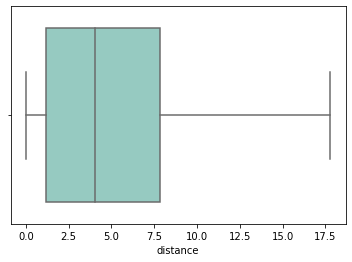

In [ ]:
fig, ax = plt.subplots()
sns.boxplot(x=prepandemic_exploded_df_merged_with_df_cc['distance'], showfliers=False, palette="Set3")
plt.ticklabel_format(style='plain', axis='x');

- distance traveled during prepandemic years

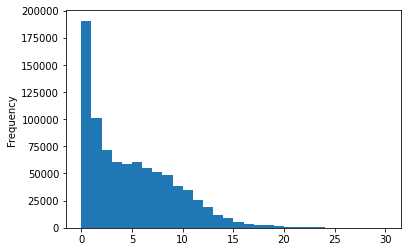

In [ ]:
prepandemic_exploded_df_merged_with_df_cc['distance'].plot(kind='hist', bins=30);

In [ ]:
prepandemic_exploded_df_merged_with_df_cc['visitor_home_cbg'].nunique()

5750

In [ ]:
prepandemic_exploded_df_merged_with_df_cc.groupby('v_countyfips')['distance'].mean()

v_countyfips
36005    5.38
36047    7.11
36061    1.74
36081    7.40
36085   13.44
Name: distance, dtype: float64

In [ ]:
pre = prepandemic_exploded_df_merged_with_df_cc.groupby('visitor_home_cbg')['distance'].mean().reset_index()
pre.columns = ['visitor_home_cbg', '2019_distance']
pre.head()

,visitor_home_cbg,2019_distance
0,360050001001,6.02
1,360050002001,5.11
2,360050002002,5.71
3,360050002003,6.10
4,360050004000,5.12


## during pandemic

In [ ]:
dfselected = df_post_pandemic
dfselected = dfselected.reset_index()
print(len(dfselected))

67741


In [ ]:
dfselected.head(1)

,date_range_start,placekey,location_name,brands,latitude,longitude,region,postal_code,iso_country_code,opened_on,closed_on,tracking_closed_since,raw_visit_counts,raw_visitor_counts,visits_by_day,visitor_home_cbgs,visitor_country_of_origin,distance_from_home,median_dwell,bucketed_dwell_times,related_same_day_brand,related_same_week_brand,related_same_day_brand.1,poi_cbg,visitor_home_aggregation,visitor_daytime_cbgs,countyfips,year,month
0,2020-04-06,zzw-22b@627-s8h-tqf,Calamia Dental Group,NaN,40.74,-73.99,NY,10010,US,NaN,NaN,2019-07-01,6.00,3.00,"[2,2,1,0,1,0,0]",{},"{""US"":4}",NaN,188.00,"{""<5"":0,""5-10"":0,""11-20"":0,""21-60"":0,""61-120"":...",{},{},{},360610068003,"{""36047028502"":4,""36047082800"":4}",{},36061,2020,4


In [ ]:
duringpandemic_exploded_df_merged_with_df_cc = explode_vertically(dfselected)
len(duringpandemic_exploded_df_merged_with_df_cc)

 # of rows in the original data 67741
 # of rows in the exploded data 160943
4005
 # of visitors in the dataset 668857
 # of unique placekeys in the dataset 2938
 # of rows in the exploded data 160943
 # of rows in the exploded repeat data 668857
 # of rows after removing Candadian CBGs from the exploded data 668751
 # of rows in the exploded_df_w_cbglatlon 668751
 # of rows in the exploded_df_w_cbglatlon 422694
visitor_home_cbg    5558
geoid               5558
dtype: int64
 # of rows in df_geo 67741
 # of rows in df_geo_no_duplicates 4005
 # of unique placekeys in df_geo_no_duplicates 4005
 # of rows in exploded_df_merged_with_df 422694
 # of rows in exploded_df_merged_with_df 422694
 # of rows in the exploded_df_merged_with_df 422694


422694

In [ ]:
# # it appears NYC (5 counties) has 5821 CBGs.

duringpandemic_exploded_df_merged_with_df_cc[['visitor_home_cbg','geoid','v_countyfips']].nunique()

visitor_home_cbg    5558
geoid               5558
v_countyfips           5
dtype: int64

In [ ]:
duringpandemic_exploded_df_merged_with_df_cc.groupby('v_countyfips')['distance'].mean()

v_countyfips
36005    5.42
36047    7.20
36061    1.57
36081    7.44
36085   13.51
Name: distance, dtype: float64

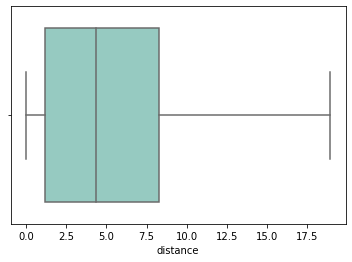

In [ ]:
fig, ax = plt.subplots()
sns.boxplot(x=duringpandemic_exploded_df_merged_with_df_cc['distance'], showfliers=False, palette="Set3")
plt.ticklabel_format(style='plain', axis='x');

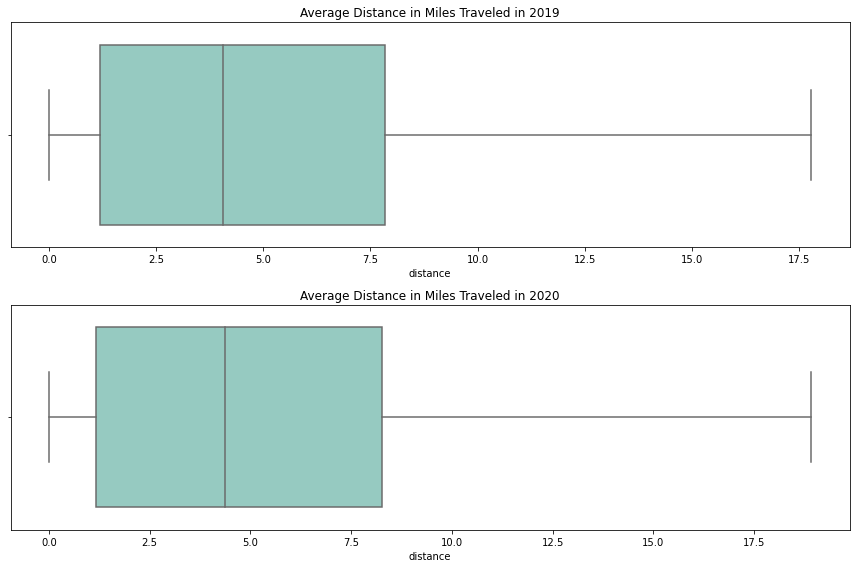

In [ ]:
fig, ax = plt.subplots(2,1, figsize=(12,8))
sns.boxplot(ax=ax[0], x=prepandemic_exploded_df_merged_with_df_cc['distance'], showfliers=False, palette="Set3")
ax[0].set_title('Average Distance in Miles Traveled in 2019')
sns.boxplot(ax=ax[1], x=duringpandemic_exploded_df_merged_with_df_cc['distance'], showfliers=False, palette="Set3")
ax[1].set_title('Average Distance in Miles Traveled in 2020')
fig.tight_layout()


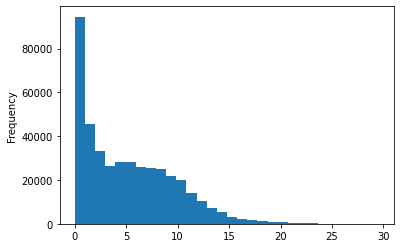

In [ ]:
duringpandemic_exploded_df_merged_with_df_cc['distance'].plot(kind='hist', bins=30);

In [ ]:
duringpandemic_exploded_df_merged_with_df_cc['visitor_home_cbg'].nunique()

5558

In [ ]:
post = duringpandemic_exploded_df_merged_with_df_cc.groupby('visitor_home_cbg')['distance'].mean().reset_index()
post.columns = ['visitor_home_cbg', '2020_distance']
post.head()

,visitor_home_cbg,2020_distance
0,360050001001,3.42
1,360050002001,5.61
2,360050002002,5.34
3,360050002003,6.26
4,360050004000,5.23


In [ ]:
type(post)

pandas.core.frame.DataFrame

In [ ]:
all = pd.merge(pre, 
               post,
               on='visitor_home_cbg',
               how='outer')
all.head()

,visitor_home_cbg,2019_distance,2020_distance
0,360050001001,6.02,3.42
1,360050002001,5.11,5.61
2,360050002002,5.71,5.34
3,360050002003,6.10,6.26
4,360050004000,5.12,5.23


In [ ]:
print(len(pre), len(post), len(all))

5750 5558 5782


In [ ]:
all.isnull().sum()

visitor_home_cbg      0
2019_distance        32
2020_distance       224
dtype: int64

In [ ]:
all[['2019_distance','2020_distance']].corr()

,2019_distance,2020_distance
2019_distance,1.00,0.89
2020_distance,0.89,1.00


In [ ]:
all = all.fillna(0)
all.isnull().sum()

visitor_home_cbg    0
2019_distance       0
2020_distance       0
dtype: int64

In [ ]:
all[['2019_distance','2020_distance']].corr()

,2019_distance,2020_distance
2019_distance,1.00,0.79
2020_distance,0.79,1.00


# RQ 1


## Descriptive & Visualization

In [ ]:
all['distance_difference'] = all['2020_distance'] - all['2019_distance']
all.head(2)

,visitor_home_cbg,2019_distance,2020_distance,distance_difference
0,360050001001,6.02,3.42,-2.60
1,360050002001,5.11,5.61,0.50


In [ ]:
print(len(all.loc[all.distance_difference > 0]))
print(len(all.loc[all.distance_difference == 0]))
print(len(all.loc[all.distance_difference < 0]))

2562
0
3220


In [ ]:
from IPython.display import clear_output 
!pip install geopandas
!pip install mapclassify
!sudo apt install libspatialindex-dev
!pip install rtree
!pip install folium==0.12.1.post1
!pip install contextily
clear_output()

In [ ]:
import rtree
import shapely, geopandas, matplotlib
import contextily as cx

import matplotlib.pyplot as plt
import plotly.graph_objects as go

In [ ]:
# data from https://catalog.data.gov/dataset/tiger-line-shapefile-2019-state-new-york-current-block-group-state-based
dfgeo = geopandas.GeoDataFrame.from_file('/content/drive/MyDrive/Safegraph-research/tl_2019_36_bg/tl_2019_36_bg.shp')
dfgeo['countyfips'] = dfgeo['GEOID'].str[0:5]
dfgeo.head(1)

,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry,countyfips
0,36,015,010200,1,360150102001,Block Group 1,G5030,S,41906395,22057,+42.2623602,-076.8963844,"POLYGON ((-76.96544 42.26472, -76.96544 42.264...",36015


In [ ]:
# focusing on 5 NY counties ... why bother visitors outside these five counties
nyc_fips = ['36061', '36047', '36005', '36085', '36081']
dfgeo_nyc = dfgeo.loc[dfgeo['countyfips'].isin(nyc_fips)]
len(dfgeo_nyc)

6493

In [ ]:
dfgeo_nyc.crs

<Geographic 2D CRS: EPSG:4269>
Name: NAD83
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: North America - onshore and offshore: Canada - Alberta; British Columbia; Manitoba; New Brunswick; Newfoundland and Labrador; Northwest Territories; Nova Scotia; Nunavut; Ontario; Prince Edward Island; Quebec; Saskatchewan; Yukon. Puerto Rico. United States (USA) - Alabama; Alaska; Arizona; Arkansas; California; Colorado; Connecticut; Delaware; Florida; Georgia; Hawaii; Idaho; Illinois; Indiana; Iowa; Kansas; Kentucky; Louisiana; Maine; Maryland; Massachusetts; Michigan; Minnesota; Mississippi; Missouri; Montana; Nebraska; Nevada; New Hampshire; New Jersey; New Mexico; New York; North Carolina; North Dakota; Ohio; Oklahoma; Oregon; Pennsylvania; Rhode Island; South Carolina; South Dakota; Tennessee; Texas; Utah; Vermont; Virginia; Washington; West Virginia; Wisconsin; Wyoming. US Virgin Islands. British Virgin Islands

In [ ]:
# https://geopandas.org/en/stable/gallery/plotting_basemap_background.html
df_wm = dfgeo_nyc.to_crs(epsg=3857)

In [ ]:
all.head(2)

,visitor_home_cbg,2019_distance,2020_distance,distance_difference
0,360050001001,6.02,3.42,-2.60
1,360050002001,5.11,5.61,0.50


In [ ]:
dfgeo_nyc.head(2)

,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry,countyfips
3,36,081,025900,2,360810259002,Block Group 2,G5030,S,64620,0,+40.7464004,-073.9045386,"POLYGON ((-73.90642 40.74564, -73.90535 40.747...",36081
4,36,081,016600,2,360810166002,Block Group 2,G5030,S,91377,0,+40.6783653,-073.8192669,"POLYGON ((-73.82136 40.68050, -73.82044 40.680...",36081


In [ ]:
print(all['visitor_home_cbg'].nunique(), dfgeo_nyc['GEOID'].nunique())

5782 6493


In [ ]:
all_dfgeonyc = all.merge(dfgeo_nyc, 
                                 how="left", 
                                 left_on='visitor_home_cbg', 
                                 right_on='GEOID')

all_dfgeonyc.shape

(5782, 18)

In [ ]:
places_gpd = geopandas.GeoDataFrame(all_dfgeonyc)
places_gpd.head(1)

,visitor_home_cbg,2019_distance,2020_distance,distance_difference,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry,countyfips
0,360050001001,6.02,3.42,-2.60,36,005,000100,1,360050001001,Block Group 1,G5030,S,1677210,0,+40.7911136,-073.8826858,"POLYGON ((-73.89266 40.79382, -73.89194 40.796...",36005


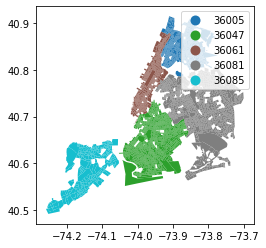

In [ ]:
places_gpd.plot(column='countyfips',legend=True);

In [ ]:
cbg_longer = places_gpd[places_gpd['distance_difference'] > 0].sort_values(by='distance_difference', ascending=False).head(20)

In [ ]:
cbg_longer_latex = cbg_longer.reset_index()[['visitor_home_cbg', 'distance_difference', '2019_distance', '2020_distance', 'countyfips']]
# cbg_longer_latex.to_latex('cbg_longer.tex')

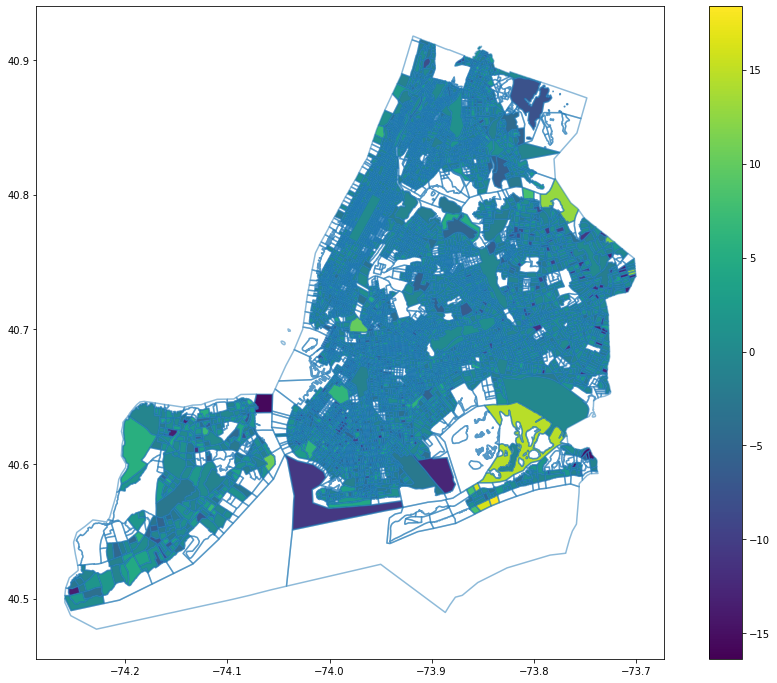

In [ ]:
f, ax = plt.subplots(1, figsize=(16, 12))
ax = places_gpd.plot(ax=ax, column='distance_difference',legend=True)
ax = dfgeo_nyc.boundary.plot(alpha=0.5, ax=ax);

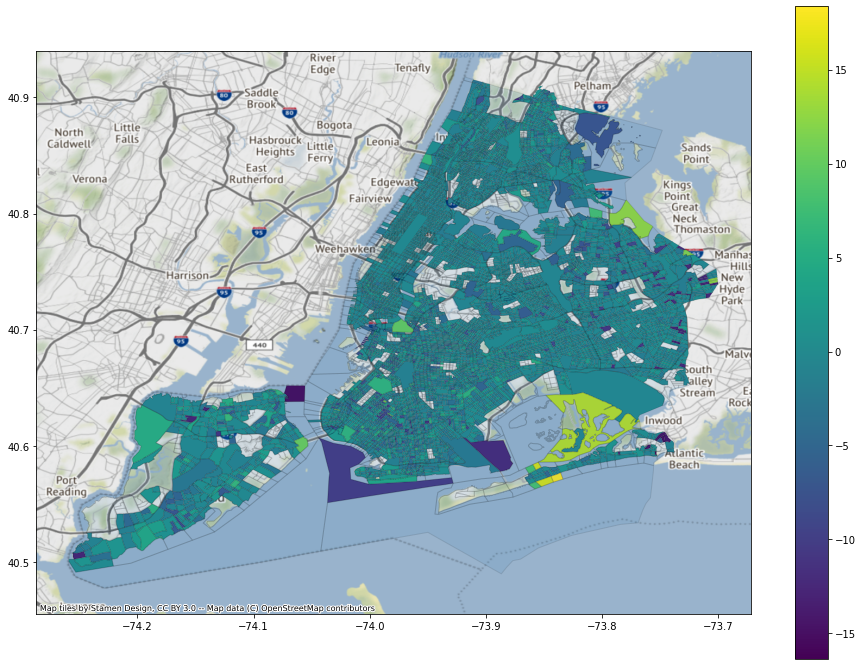

In [ ]:
f, ax = plt.subplots(1, figsize=(16, 12))
ax = places_gpd.plot(ax=ax, column='distance_difference', legend=True)
ax = dfgeo_nyc.plot( alpha=0.1, edgecolor='k', ax=ax)
cx.add_basemap(ax, crs=dfgeo_nyc.crs)

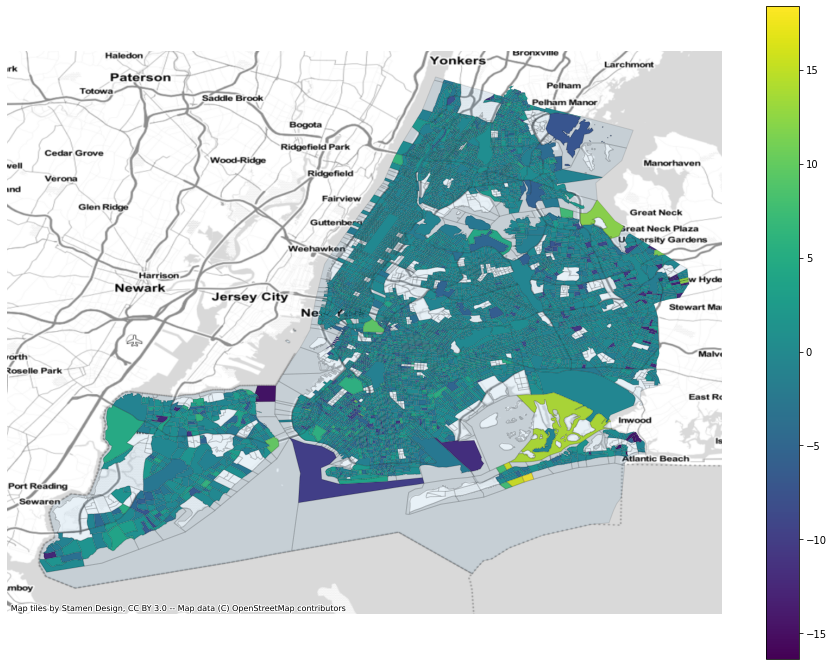

In [ ]:
f, ax = plt.subplots(1, figsize=(16, 12))
ax = places_gpd.plot(ax=ax, column='distance_difference', legend=True)
ax = dfgeo_nyc.plot( alpha=0.1, edgecolor='k', ax=ax)
cx.add_basemap(ax, crs=dfgeo_nyc.crs, source=cx.providers.Stamen.TonerLite)
ax.set_axis_off()

## Visualization of CBGs having experienced most distance increase

In [ ]:
all.sort_values('distance_difference', ascending=False).head()

,visitor_home_cbg,2019_distance,2020_distance,distance_difference
5772,360810934020,0.00,18.36,18.36
5771,360810928000,0.00,16.20,16.20
5775,360811072020,0.00,14.63,14.63
5777,360811579013,0.00,13.08,13.08
5778,360811579014,0.00,12.92,12.92


In [ ]:
places_gpd.sort_values('distance_difference', ascending=False).head(20)

,visitor_home_cbg,2019_distance,2020_distance,distance_difference,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry,countyfips
5772,360810934020,0.00,18.36,18.36,36,081,093402,0,360810934020,Block Group 0,G5030,S,0,460266,+40.5727257,-073.8386148,"POLYGON ((-73.84378 40.57389, -73.84138 40.574...",36081
5771,360810928000,0.00,16.20,16.20,36,081,092800,0,360810928000,Block Group 0,G5030,S,0,897590,+40.5701968,-073.8461448,"MULTIPOLYGON (((-73.85688 40.56922, -73.85681 ...",36081
5775,360811072020,0.00,14.63,14.63,36,081,107202,0,360811072020,Block Group 0,G5030,S,0,16456994,+40.6184253,-073.8130698,"POLYGON ((-73.85352 40.58659, -73.84985 40.588...",36081
5777,360811579013,0.00,13.08,13.08,36,081,157901,3,360811579013,Block Group 3,G5030,S,137077,0,+40.7432950,-073.7044865,"POLYGON ((-73.70861 40.74336, -73.70767 40.743...",36081
5778,360811579014,0.00,12.92,12.92,36,081,157901,4,360811579014,Block Group 4,G5030,S,147978,0,+40.7413346,-073.7040019,"POLYGON ((-73.70795 40.74158, -73.70701 40.741...",36081
5774,360810997050,0.00,12.81,12.81,36,081,099705,0,360810997050,Block Group 0,G5030,S,0,4538936,+40.7950060,-073.7748800,"POLYGON ((-73.79356 40.80038, -73.79337 40.800...",36081
5776,360811507023,0.00,11.94,11.94,36,081,150702,3,360811507023,Block Group 3,G5030,S,252257,0,+40.7659359,-073.7266090,"POLYGON ((-73.73050 40.76492, -73.73038 40.764...",36081
5753,360470232004,0.00,10.98,10.98,36,047,023200,4,360470232004,Block Group 4,G5030,S,37729,0,+40.6382806,-073.9869370,"POLYGON ((-73.98804 40.63895, -73.98758 40.639...",36047
5780,360850018001,0.00,10.61,10.61,36,085,001800,1,360850018001,Block Group 1,G5030,S,909602,0,+40.6015394,-074.0585173,"POLYGON ((-74.06516 40.60420, -74.06043 40.606...",36085
1164,360470066002,5.30,15.73,10.44,36,047,006600,2,360470066002,Block Group 2,G5030,S,39405,0,+40.6311041,-074.0279184,"POLYGON ((-74.03047 40.63210, -74.02779 40.631...",36047


Several CBGs never had pre-pandemic visitors. What does this mean?

- (Guessing) these CBGs had more covid cases?



In [ ]:
print(prepandemic_exploded_df_merged_with_df_cc.shape[0], 
      duringpandemic_exploded_df_merged_with_df_cc.shape[0])

853843 422694


In [ ]:
prepandemic_exploded_df_merged_with_df_cc.head(2)

,placekey,visitor_home_cbg,raw_visit_counts,geoid,v_countyfips,v_lat,v_lon,v_geometry,location_name,brands,h_latitude,h_longitude,h_region,h_postal_code,distance_from_home,h_poicbg,h_coor,v_coor,distance
0,zzy-222@627-s4m-ty9,360610166003,4,360610166003,36061,40.79,-73.95,"POLYGON ((-73.949063 40.78843, -73.948605 40.7...",NYC Lipo LLC,NaN,40.78,-73.96,NY,10028,NaN,360610150011,"(40.779496, -73.959248)","(40.7880897, -73.9482622)",0.83
1,zzy-222@627-s4m-ty9,360610166003,4,360610166003,36061,40.79,-73.95,"POLYGON ((-73.949063 40.78843, -73.948605 40.7...",NYC Lipo LLC,NaN,40.78,-73.96,NY,10028,NaN,360610150011,"(40.779496, -73.959248)","(40.7880897, -73.9482622)",0.83


In [ ]:
duringpandemic_exploded_df_merged_with_df_cc.head(2)

,placekey,visitor_home_cbg,raw_visit_counts,geoid,v_countyfips,v_lat,v_lon,v_geometry,location_name,brands,h_latitude,h_longitude,h_region,h_postal_code,distance_from_home,h_poicbg,h_coor,v_coor,distance
0,225-223@627-s8j-tvz,360850121002,4,360850121002,36085,40.63,-74.11,"POLYGON ((-74.11619 40.628941, -74.113359 40.6...",Shupack Jerome L MD PC,NaN,40.74,-73.97,NY,10016,NaN,360610062001,"(40.741393, -73.97464)","(40.6259367, -74.1126793)",10.77
1,225-223@627-s8j-tvz,360850121002,4,360850121002,36085,40.63,-74.11,"POLYGON ((-74.11619 40.628941, -74.113359 40.6...",Shupack Jerome L MD PC,NaN,40.74,-73.97,NY,10016,NaN,360610062001,"(40.741393, -73.97464)","(40.6259367, -74.1126793)",10.77


# Visuals

In [ ]:
pre_sample = prepandemic_exploded_df_merged_with_df_cc[prepandemic_exploded_df_merged_with_df_cc['visitor_home_cbg'] == '360470066002']
pre_sample.shape[0]

20

In [ ]:
pre_sample_dfgeo_nyc = pre_sample.merge(dfgeo_nyc, 
                                 how="left", 
                                 left_on='visitor_home_cbg', 
                                 right_on='GEOID')

pre_sample_dfgeo_nyc.shape

(20, 33)

In [ ]:
pre_places_gpd = geopandas.GeoDataFrame(pre_sample_dfgeo_nyc)
pre_places_gpd.head()

,placekey,visitor_home_cbg,raw_visit_counts,geoid,v_countyfips,v_lat,v_lon,v_geometry,location_name,brands,h_latitude,h_longitude,h_region,h_postal_code,distance_from_home,h_poicbg,h_coor,v_coor,distance,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry,countyfips
0,zzy-223@627-wh2-k75,360470066002,4,360470066002,36047,40.63,-74.03,"POLYGON ((-74.030473 40.632099, -74.027791 40....",Rogosin Kidney Center Bklyn,NaN,40.67,-73.98,NY,11215,3.78,360470153001,"(40.667834, -73.97908)","(40.6311041, -74.0279184)",3.60,36,047,006600,2,360470066002,Block Group 2,G5030,S,39405,0,+40.6311041,-074.0279184,"POLYGON ((-74.03047 40.63210, -74.02779 40.631...",36047
1,zzy-223@627-wh2-k75,360470066002,4,360470066002,36047,40.63,-74.03,"POLYGON ((-74.030473 40.632099, -74.027791 40....",Rogosin Kidney Center Bklyn,NaN,40.67,-73.98,NY,11215,3.78,360470153001,"(40.667834, -73.97908)","(40.6311041, -74.0279184)",3.60,36,047,006600,2,360470066002,Block Group 2,G5030,S,39405,0,+40.6311041,-074.0279184,"POLYGON ((-74.03047 40.63210, -74.02779 40.631...",36047
2,zzy-223@627-wh2-k75,360470066002,4,360470066002,36047,40.63,-74.03,"POLYGON ((-74.030473 40.632099, -74.027791 40....",Rogosin Kidney Center Bklyn,NaN,40.67,-73.98,NY,11215,3.78,360470153001,"(40.667834, -73.97908)","(40.6311041, -74.0279184)",3.60,36,047,006600,2,360470066002,Block Group 2,G5030,S,39405,0,+40.6311041,-074.0279184,"POLYGON ((-74.03047 40.63210, -74.02779 40.631...",36047
3,zzy-223@627-wh2-k75,360470066002,4,360470066002,36047,40.63,-74.03,"POLYGON ((-74.030473 40.632099, -74.027791 40....",Rogosin Kidney Center Bklyn,NaN,40.67,-73.98,NY,11215,3.78,360470153001,"(40.667834, -73.97908)","(40.6311041, -74.0279184)",3.60,36,047,006600,2,360470066002,Block Group 2,G5030,S,39405,0,+40.6311041,-074.0279184,"POLYGON ((-74.03047 40.63210, -74.02779 40.631...",36047
4,zzy-223@627-wh2-k75,360470066002,4,360470066002,36047,40.63,-74.03,"POLYGON ((-74.030473 40.632099, -74.027791 40....",Rogosin Kidney Center Bklyn,NaN,40.67,-73.98,NY,11215,3.78,360470153001,"(40.667834, -73.97908)","(40.6311041, -74.0279184)",3.60,36,047,006600,2,360470066002,Block Group 2,G5030,S,39405,0,+40.6311041,-074.0279184,"POLYGON ((-74.03047 40.63210, -74.02779 40.631...",36047


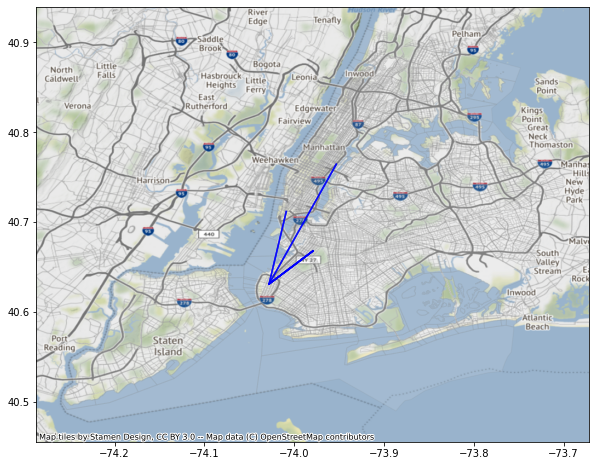

In [ ]:
fig, ax = plt.subplots(figsize=(10, 8))
ax = dfgeo_nyc.plot( alpha=0.1, edgecolor="grey", color="white", ax=ax)
cx.add_basemap(ax, crs=dfgeo_nyc.crs)

#minx, miny, maxx, maxy = places_gpd.total_bounds
#ax.set_xlim(minx, maxx)
#ax.set_ylim(miny, maxy)

# https://coderzcolumn.com/tutorials/data-science/how-to-create-connection-map-chart-in-python-jupyter-notebook-plotly-and-geopandas
for slat,dlat, slon, dlon in zip(pre_places_gpd["v_lat"], pre_places_gpd["h_latitude"], 
                                pre_places_gpd["v_lon"], pre_places_gpd["h_longitude"]):
  ax.plot([slon , dlon], [slat, dlat], color="blue", alpha=0.5)

In [ ]:
during_sample = duringpandemic_exploded_df_merged_with_df_cc[duringpandemic_exploded_df_merged_with_df_cc['visitor_home_cbg'] == '360470066002']
during_sample.shape[0]

4

In [ ]:
during_sample_dfgeo_nyc = during_sample.merge(dfgeo_nyc, 
                                 how="left", 
                                 left_on='visitor_home_cbg', 
                                 right_on='GEOID')

during_sample_dfgeo_nyc.shape

(4, 33)

In [ ]:
during_places_gpd = geopandas.GeoDataFrame(during_sample_dfgeo_nyc)
during_places_gpd.head(1)

,placekey,visitor_home_cbg,raw_visit_counts,geoid,v_countyfips,v_lat,v_lon,v_geometry,location_name,brands,h_latitude,h_longitude,h_region,h_postal_code,distance_from_home,h_poicbg,h_coor,v_coor,distance,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry,countyfips
0,zzw-223@627-s6m-bff,360470066002,4,360470066002,36047,40.63,-74.03,"POLYGON ((-74.030473 40.632099, -74.027791 40....",Diamond Braces,NaN,40.85,-73.93,NY,10033,1.29,360610261003,"(40.847316, -73.933727)","(40.6311041, -74.0279184)",15.73,36,047,006600,2,360470066002,Block Group 2,G5030,S,39405,0,+40.6311041,-074.0279184,"POLYGON ((-74.03047 40.63210, -74.02779 40.631...",36047


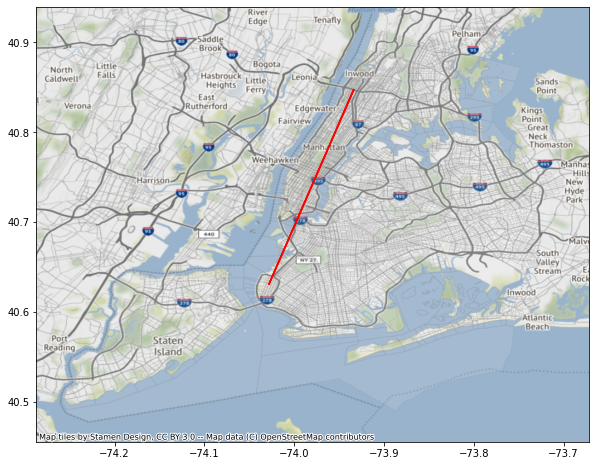

In [ ]:
fig, ax = plt.subplots(figsize=(10, 8))
ax = dfgeo_nyc.plot( alpha=0.1, edgecolor="grey", color="white", ax=ax)
cx.add_basemap(ax, crs=dfgeo_nyc.crs)

# https://coderzcolumn.com/tutorials/data-science/how-to-create-connection-map-chart-in-python-jupyter-notebook-plotly-and-geopandas
for slat,dlat, slon, dlon in zip(during_places_gpd["v_lat"], during_places_gpd["h_latitude"], 
                                during_places_gpd["v_lon"], during_places_gpd["h_longitude"]):
  plt.plot([slon , dlon], [slat, dlat], color="red", alpha=0.9)

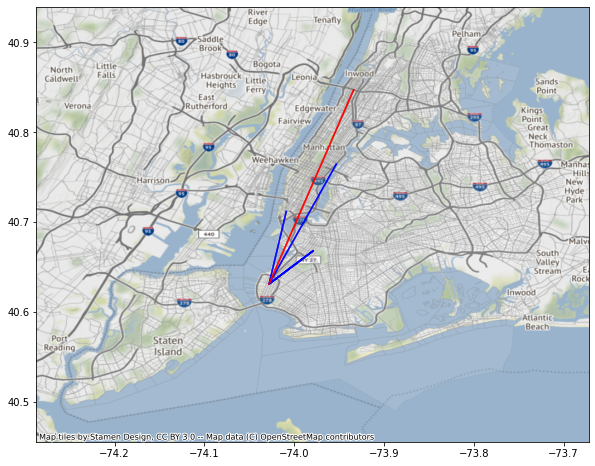

In [ ]:
fig, ax = plt.subplots(figsize=(10, 8))
ax = dfgeo_nyc.plot( alpha=0.1, edgecolor="grey", color="white", ax=ax)
cx.add_basemap(ax, crs=dfgeo_nyc.crs)

# https://coderzcolumn.com/tutorials/data-science/how-to-create-connection-map-chart-in-python-jupyter-notebook-plotly-and-geopandas
for slat,dlat, slon, dlon in zip(pre_places_gpd["v_lat"], pre_places_gpd["h_latitude"], 
                                pre_places_gpd["v_lon"], pre_places_gpd["h_longitude"]):
  ax.plot([slon , dlon], [slat, dlat], color="blue", alpha=0.5)

for slat,dlat, slon, dlon in zip(during_places_gpd["v_lat"], during_places_gpd["h_latitude"], 
                                during_places_gpd["v_lon"], during_places_gpd["h_longitude"]):
  ax.plot([slon , dlon], [slat, dlat], color="red", alpha=0.5)

# Visual function

In [ ]:
prepandemic_exploded_df_merged_with_df_cc.columns

Index(['placekey', 'visitor_home_cbg', 'raw_visit_counts', 'geoid',
       'v_countyfips', 'v_lat', 'v_lon', 'v_geometry', 'location_name',
       'brands', 'h_latitude', 'h_longitude', 'h_region', 'h_postal_code',
       'distance_from_home', 'h_poicbg', 'h_coor', 'v_coor', 'distance'],
      dtype='object')

In [ ]:
prepandemic_exploded_df_merged_with_df_cc[prepandemic_exploded_df_merged_with_df_cc['distance'] > 10]['location_name'].value_counts().head(50)

New York Presbyterian Hospital New York Weill Cornell Medical Ce    11770
New York Presbyterian Hospital                                       8493
The Society Of The NY Hospital                                       4686
Mount Sinai Hospitals                                                3758
Emergency Department at NYU Langone Health                           2748
Ichan School of Medicine at Mount Sinai                              2115
Morgan Stanley Children's Hospital                                   1932
Bellevue Hospital Center                                             1658
Hospital For Special Surgery                                         1632
Lenox Hill Hospital                                                  1302
Douglas Brylka M D                                                   1235
67th Street OB GYN                                                   1170
Mount Sinai Executive Health Program                                  969
William Joe Ledger MD FACOG           

In [ ]:
def visual_hospitals(x):
  pre_sample = prepandemic_exploded_df_merged_with_df_cc[prepandemic_exploded_df_merged_with_df_cc['location_name'] == x].drop_duplicates()
  pre_places_gpd = geopandas.GeoDataFrame(pre_sample, geometry=geopandas.points_from_xy(pre_sample.h_longitude, pre_sample.h_latitude))
  
  during_sample = duringpandemic_exploded_df_merged_with_df_cc[duringpandemic_exploded_df_merged_with_df_cc['location_name'] == x].drop_duplicates()
  during_places_gpd = geopandas.GeoDataFrame(during_sample, geometry=geopandas.points_from_xy(during_sample.h_longitude, during_sample.h_latitude))

  print(pre_sample.shape, during_sample.shape)

  fig, ax = plt.subplots(figsize=(10, 8))
  ax = dfgeo_nyc.plot( alpha=0.1, edgecolor="grey", color="white", ax=ax)
  cx.add_basemap(ax, crs=dfgeo_nyc.crs)

  # https://coderzcolumn.com/tutorials/data-science/how-to-create-connection-map-chart-in-python-jupyter-notebook-plotly-and-geopandas
  for slat,dlat, slon, dlon in zip(pre_places_gpd["v_lat"], pre_places_gpd["h_latitude"], 
                                  pre_places_gpd["v_lon"], pre_places_gpd["h_longitude"]):
    ax.plot([slon , dlon], [slat, dlat], color="blue", alpha=0.9)

  for slat,dlat, slon, dlon in zip(during_places_gpd["v_lat"], during_places_gpd["h_latitude"], 
                                  during_places_gpd["v_lon"], during_places_gpd["h_longitude"]):
    ax.plot([slon , dlon], [slat, dlat], color="red", alpha=0.5)



(34, 20) (4, 20)


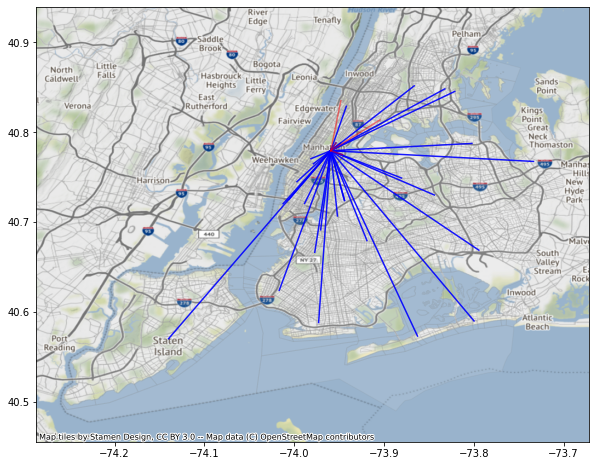

In [ ]:
visual_hospitals('NYC Lipo LLC')

(464, 20) (185, 20)


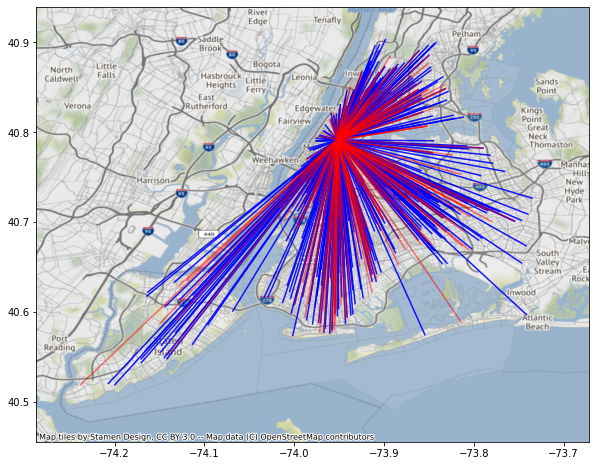

In [ ]:
visual_hospitals('Mount Sinai Internal Medicine Associates Primary Care')

(627, 20) (209, 20)


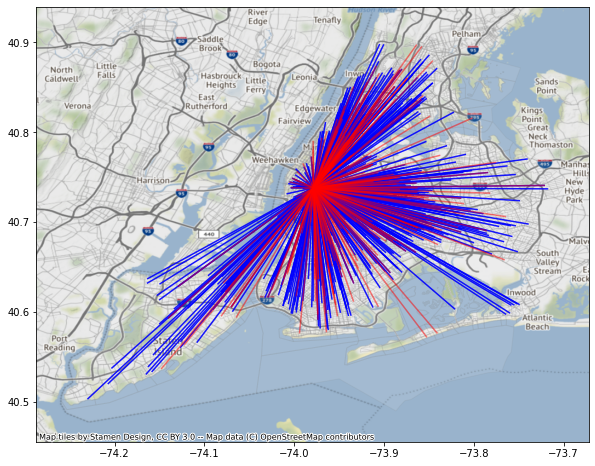

In [ ]:
visual_hospitals('New York University College of Dentistry')

(96, 20) (63, 20)


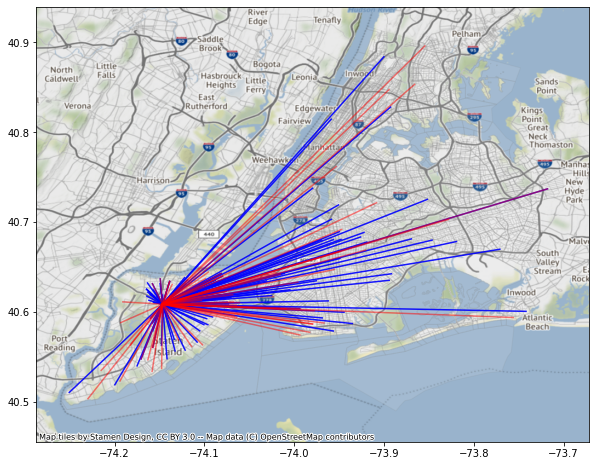

In [ ]:
visual_hospitals('Staten Island University Hospital')

(32, 20) (15, 20)


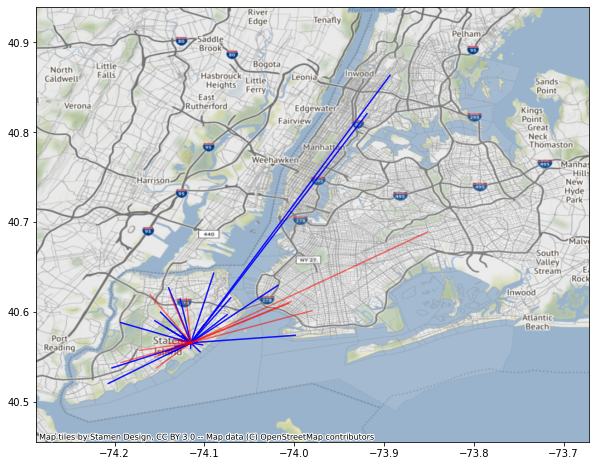

In [ ]:
visual_hospitals('Luis H Mora DPM')

In [ ]:
def visual_visits(x):
  pre_sample = prepandemic_exploded_df_merged_with_df_cc[prepandemic_exploded_df_merged_with_df_cc['visitor_home_cbg'] == x]
  pre_sample_dfgeo_nyc = pre_sample.merge(dfgeo_nyc, 
                                 how="left", 
                                 left_on='visitor_home_cbg', 
                                 right_on='GEOID')
  pre_places_gpd = geopandas.GeoDataFrame(pre_sample_dfgeo_nyc)

  during_sample = duringpandemic_exploded_df_merged_with_df_cc[duringpandemic_exploded_df_merged_with_df_cc['visitor_home_cbg'] == x]
  during_sample_dfgeo_nyc = during_sample.merge(dfgeo_nyc, 
                                 how="left", 
                                 left_on='visitor_home_cbg', 
                                 right_on='GEOID')
  during_places_gpd = geopandas.GeoDataFrame(during_sample_dfgeo_nyc)

  print(pre_sample.shape, during_sample.shape)

  fig, ax = plt.subplots(figsize=(10, 8))
  ax = dfgeo_nyc.plot( alpha=0.1, edgecolor="grey", color="white", ax=ax)
  cx.add_basemap(ax, crs=dfgeo_nyc.crs)

  # https://coderzcolumn.com/tutorials/data-science/how-to-create-connection-map-chart-in-python-jupyter-notebook-plotly-and-geopandas
  for slat,dlat, slon, dlon in zip(pre_places_gpd["v_lat"], pre_places_gpd["h_latitude"], 
                                  pre_places_gpd["v_lon"], pre_places_gpd["h_longitude"]):
    ax.plot([slon , dlon], [slat, dlat], color="blue", alpha=0.9)

  for slat,dlat, slon, dlon in zip(during_places_gpd["v_lat"], during_places_gpd["h_latitude"], 
                                  during_places_gpd["v_lon"], during_places_gpd["h_longitude"]):
    ax.plot([slon , dlon], [slat, dlat], color="red", alpha=0.9)

  print(f"Before pandemic: {pre_sample['distance'].mean()}")
  print(f"During pandemic: {during_sample['distance'].mean()}")









In [ ]:
prepandemic_exploded_df_merged_with_df_cc[prepandemic_exploded_df_merged_with_df_cc['v_countyfips'] == '36061']['visitor_home_cbg'].value_counts().head(3)

360610168002    2885
360610116001    2551
360610124006    2251
Name: visitor_home_cbg, dtype: int64

(20, 19) (4, 19)
Before pandemic: 5.2978091460000005
During pandemic: 15.73311372


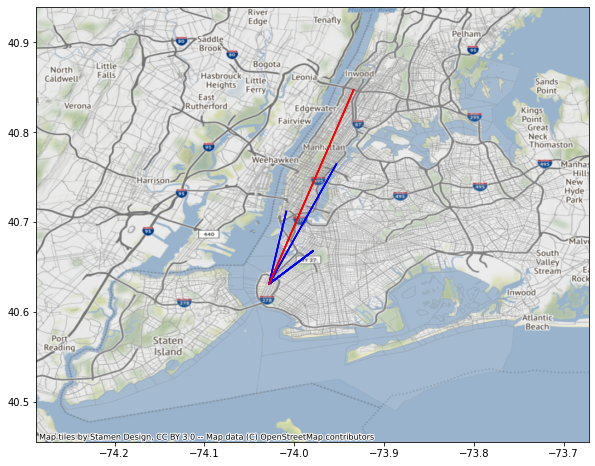

In [ ]:
visual_visits('360470066002') # Brooklyn

(43, 19) (4, 19)
Before pandemic: 2.1643941483720943
During pandemic: 9.84873035


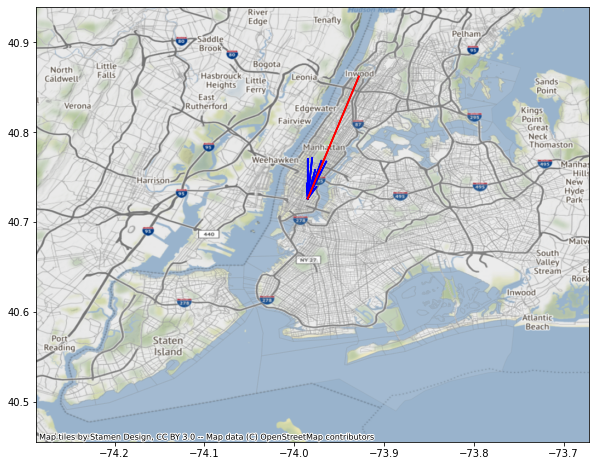

In [ ]:
visual_visits('360610032002') # Manhattan

(450, 19) (202, 19)
Before pandemic: 12.465806919555511
During pandemic: 11.906268144455444


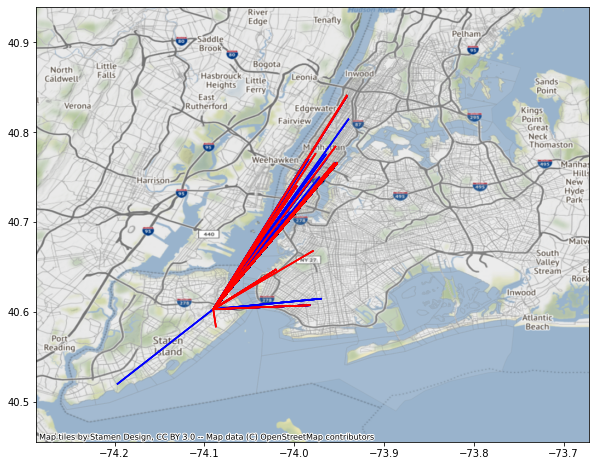

In [ ]:
visual_visits('360850050001') # Staten Island

(859, 19) (415, 19)
Before pandemic: 5.160988894051224
During pandemic: 5.030649561590376


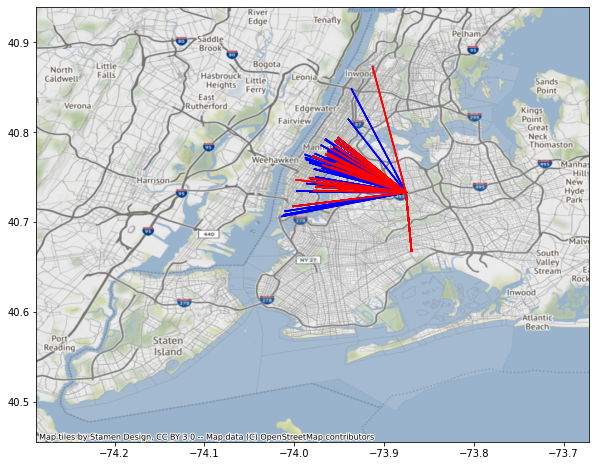

In [ ]:
visual_visits('360810475002') # Queens

(650, 19) (202, 19)
Before pandemic: 5.80355734223073
During pandemic: 4.6293369937623785


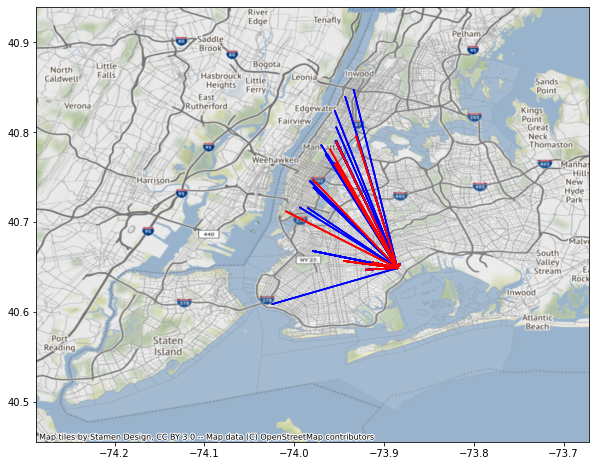

In [ ]:
visual_visits('360471058043') # brooklyn

(2885, 19) (1090, 19)
Before pandemic: 0.7153757094142196
During pandemic: 0.4552027130366972


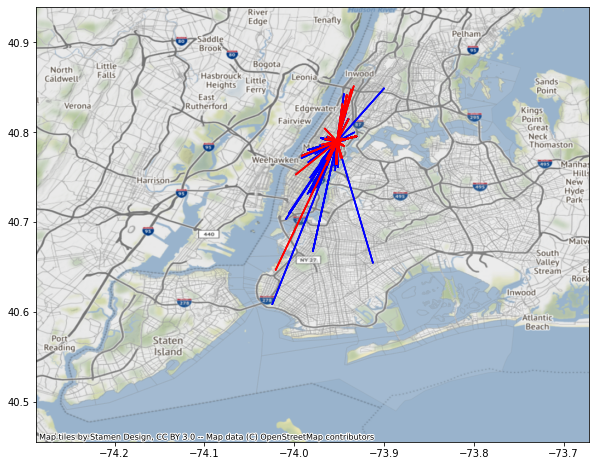

In [ ]:
visual_visits('360610168002') # manhattan

(56, 19) (52, 19)
Before pandemic: 8.221182166428568
During pandemic: 15.192520949999988


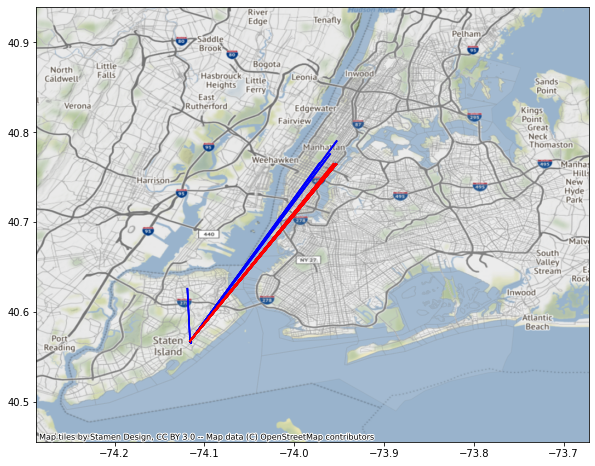

In [ ]:
visual_visits('360850134002')

# 360810934020

In [ ]:
duringpandemic_exploded_df_merged_with_df_cc[duringpandemic_exploded_df_merged_with_df_cc['visitor_home_cbg'] == '360810934020'].drop_duplicates()

,placekey,visitor_home_cbg,raw_visit_counts,geoid,v_countyfips,v_lat,v_lon,v_geometry,location_name,brands,h_latitude,h_longitude,h_region,h_postal_code,distance_from_home,h_poicbg,h_coor,v_coor,distance
190767,zzw-223@627-s6d-wff,360810934020,4,360810934020,36081,40.57,-73.84,"POLYGON ((-73.843784 40.573887, -73.841383 40....",New York Presbyterian Hospital Columbia Univer...,NaN,40.84,-73.94,NY,10032,5.54,360610251001,"(40.840946, -73.941446)","(40.5727257, -73.8386148)",19.30
254073,zzw-224@627-s6g-kxq,360810934020,4,360810934020,36081,40.57,-73.84,"POLYGON ((-73.843784 40.573887, -73.841383 40....",Lincoln Hospital,NaN,40.82,-73.92,NY,10451,4.66,360050065001,"(40.816302, -73.924534)","(40.5727257, -73.8386148)",17.42


# 360810928000

In [ ]:
duringpandemic_exploded_df_merged_with_df_cc[duringpandemic_exploded_df_merged_with_df_cc['visitor_home_cbg'] == '360810928000'].drop_duplicates()

,placekey,visitor_home_cbg,raw_visit_counts,geoid,v_countyfips,v_lat,v_lon,v_geometry,location_name,brands,h_latitude,h_longitude,h_region,h_postal_code,distance_from_home,h_poicbg,h_coor,v_coor,distance
308939,zzw-222@627-s4v-g6k,360810928000,4,360810928000,36081,40.57,-73.85,"MULTIPOLYGON (((-73.856883 40.569219, -73.8568...",Mount Sinai Executive Health Program,NaN,40.79,-73.95,NY,10029,9.01,360610168002,"(40.790022, -73.953774)","(40.5701968, -73.8461448)",16.20


# 360811072020

In [ ]:
duringpandemic_exploded_df_merged_with_df_cc[duringpandemic_exploded_df_merged_with_df_cc['visitor_home_cbg'] == '360811072020'].drop_duplicates()

,placekey,visitor_home_cbg,raw_visit_counts,geoid,v_countyfips,v_lat,v_lon,v_geometry,location_name,brands,h_latitude,h_longitude,h_region,h_postal_code,distance_from_home,h_poicbg,h_coor,v_coor,distance
338516,22b-222@627-s4v-6tv,360811072020,4,360811072020,36081,40.62,-73.81,"POLYGON ((-73.853522 40.586591999999996, -73.8...",Donald E Zuehlke LCSW,NaN,40.80,-73.96,NY,10026,1.05,360610216005,"(40.800164, -73.956325)","(40.618376, -73.8130965)",14.63


# 360470066002

In [ ]:
df_ex = duringpandemic_exploded_df_merged_with_df_cc[prepandemic_exploded_df_merged_with_df_cc['visitor_home_cbg'] == '360470066002'].drop_duplicates()
df_ex = df_ex[['raw_visit_counts', 'location_name', 'h_poicbg', 'distance']].reset_index()
df_ex.to_latex('360470066002.tex')

# 360610032002

In [ ]:
duringpandemic_exploded_df_merged_with_df_cc[prepandemic_exploded_df_merged_with_df_cc['visitor_home_cbg'] == '360610032002']

,placekey,visitor_home_cbg,raw_visit_counts,geoid,v_countyfips,v_lat,v_lon,v_geometry,location_name,brands,h_latitude,h_longitude,h_region,h_postal_code,distance_from_home,h_poicbg,h_coor,v_coor,distance
25681,zzw-227@627-s8n-6ff,360850277022,4,360850277022,36085,40.58,-74.17,"POLYGON ((-74.169919 40.573974, -74.1697559999...",New York Presbyterian Hospital,NaN,40.76,-73.95,NY,10021,9.00,360610116001,"(40.764424, -73.953118)","(40.580142, -74.1661584)",16.93
25682,zzw-227@627-s8n-6ff,360850277022,4,360850277022,36085,40.58,-74.17,"POLYGON ((-74.169919 40.573974, -74.1697559999...",New York Presbyterian Hospital,NaN,40.76,-73.95,NY,10021,9.00,360610116001,"(40.764424, -73.953118)","(40.580142, -74.1661584)",16.93
25683,zzw-227@627-s8n-6ff,360850277022,4,360850277022,36085,40.58,-74.17,"POLYGON ((-74.169919 40.573974, -74.1697559999...",New York Presbyterian Hospital,NaN,40.76,-73.95,NY,10021,9.00,360610116001,"(40.764424, -73.953118)","(40.580142, -74.1661584)",16.93
25684,zzw-227@627-s8n-6ff,360850277022,4,360850277022,36085,40.58,-74.17,"POLYGON ((-74.169919 40.573974, -74.1697559999...",New York Presbyterian Hospital,NaN,40.76,-73.95,NY,10021,9.00,360610116001,"(40.764424, -73.953118)","(40.580142, -74.1661584)",16.93
50578,25m-222@627-s4k-k9f,360050067003,4,360050067003,36005,40.82,-73.92,"POLYGON ((-73.92119 40.820833, -73.920891 40.8...",TLC Kids Therapy,NaN,40.79,-73.97,NY,10024,5.22,360610173007,"(40.786295, -73.971002)","(40.8203585, -73.9209033)",3.52
50579,25m-222@627-s4k-k9f,360050067003,4,360050067003,36005,40.82,-73.92,"POLYGON ((-73.92119 40.820833, -73.920891 40.8...",TLC Kids Therapy,NaN,40.79,-73.97,NY,10024,5.22,360610173007,"(40.786295, -73.971002)","(40.8203585, -73.9209033)",3.52
50580,25m-222@627-s4k-k9f,360050067003,4,360050067003,36005,40.82,-73.92,"POLYGON ((-73.92119 40.820833, -73.920891 40.8...",TLC Kids Therapy,NaN,40.79,-73.97,NY,10024,5.22,360610173007,"(40.786295, -73.971002)","(40.8203585, -73.9209033)",3.52
50581,22v-223@627-s4q-xt9,360610187005,6,360610187005,36061,40.80,-73.97,"POLYGON ((-73.96945699999999 40.797838, -73.96...",Gorti Usha DDS,NaN,40.78,-73.99,NY,10023,NaN,360610159002,"(40.779484, -73.985223)","(40.7975531, -73.968745)",1.52
232664,zzw-228@627-s8n-6ff,360050155001,5,360050155001,36005,40.84,-73.89,"POLYGON ((-73.890601 40.836898, -73.888741 40....",New York Presbyterian Hospital,NaN,40.76,-73.95,NY,10065,8.69,360610116001,"(40.764437, -73.953051)","(40.8373154, -73.8888886)",6.05
232665,zzw-228@627-s8n-6ff,360050155001,5,360050155001,36005,40.84,-73.89,"POLYGON ((-73.890601 40.836898, -73.888741 40....",New York Presbyterian Hospital,NaN,40.76,-73.95,NY,10065,8.69,360610116001,"(40.764437, -73.953051)","(40.8373154, -73.8888886)",6.05


In [ ]:
prepandemic_exploded_df_merged_with_df_cc[prepandemic_exploded_df_merged_with_df_cc['visitor_home_cbg'] == '360610032002']

,placekey,visitor_home_cbg,raw_visit_counts,geoid,v_countyfips,v_lat,v_lon,v_geometry,location_name,brands,h_latitude,h_longitude,h_region,h_postal_code,distance_from_home,h_poicbg,h_coor,v_coor,distance
25681,22g-223@627-s8r-jgk,360610032002,4,360610032002,36061,40.73,-73.98,"POLYGON ((-73.985753 40.726988, -73.983535 40....",67th Street OB GYN,NaN,40.77,-73.96,NY,10065,8.22,360610120001,"(40.767442, -73.964212)","(40.7262306, -73.9848553)",3.04
25682,22g-223@627-s8r-jgk,360610032002,4,360610032002,36061,40.73,-73.98,"POLYGON ((-73.985753 40.726988, -73.983535 40....",67th Street OB GYN,NaN,40.77,-73.96,NY,10065,8.22,360610120001,"(40.767442, -73.964212)","(40.7262306, -73.9848553)",3.04
25683,22g-223@627-s8r-jgk,360610032002,4,360610032002,36061,40.73,-73.98,"POLYGON ((-73.985753 40.726988, -73.983535 40....",67th Street OB GYN,NaN,40.77,-73.96,NY,10065,8.22,360610120001,"(40.767442, -73.964212)","(40.7262306, -73.9848553)",3.04
25684,22g-223@627-s8r-jgk,360610032002,4,360610032002,36061,40.73,-73.98,"POLYGON ((-73.985753 40.726988, -73.983535 40....",67th Street OB GYN,NaN,40.77,-73.96,NY,10065,8.22,360610120001,"(40.767442, -73.964212)","(40.7262306, -73.9848553)",3.04
50578,222-225@627-s8j-rkz,360610032002,4,360610032002,36061,40.73,-73.98,"POLYGON ((-73.985753 40.726988, -73.983535 40....",Bellevue Hospital Center,NaN,40.74,-73.98,NY,10016,6.85,360610062001,"(40.739218, -73.975239)","(40.7262306, -73.9848553)",1.03
50579,222-225@627-s8j-rkz,360610032002,4,360610032002,36061,40.73,-73.98,"POLYGON ((-73.985753 40.726988, -73.983535 40....",Bellevue Hospital Center,NaN,40.74,-73.98,NY,10016,6.85,360610062001,"(40.739218, -73.975239)","(40.7262306, -73.9848553)",1.03
50580,222-225@627-s8j-rkz,360610032002,4,360610032002,36061,40.73,-73.98,"POLYGON ((-73.985753 40.726988, -73.983535 40....",Bellevue Hospital Center,NaN,40.74,-73.98,NY,10016,6.85,360610062001,"(40.739218, -73.975239)","(40.7262306, -73.9848553)",1.03
50581,222-225@627-s8j-rkz,360610032002,4,360610032002,36061,40.73,-73.98,"POLYGON ((-73.985753 40.726988, -73.983535 40....",Bellevue Hospital Center,NaN,40.74,-73.98,NY,10016,6.85,360610062001,"(40.739218, -73.975239)","(40.7262306, -73.9848553)",1.03
232664,zzy-222@627-s8j-4sq,360610032002,4,360610032002,36061,40.73,-73.98,"POLYGON ((-73.985753 40.726988, -73.983535 40....",Mount Sinai Beth Israel,NaN,40.73,-73.98,NY,10003,6.50,360610048005,"(40.733399, -73.982403)","(40.7262306, -73.9848553)",0.51
232665,zzy-222@627-s8j-4sq,360610032002,4,360610032002,36061,40.73,-73.98,"POLYGON ((-73.985753 40.726988, -73.983535 40....",Mount Sinai Beth Israel,NaN,40.73,-73.98,NY,10003,6.50,360610048005,"(40.733399, -73.982403)","(40.7262306, -73.9848553)",0.51


# RQ 2

In [ ]:
df_all = all.merge(census_df,
                             how='left',
                             left_on = 'visitor_home_cbg',
                             right_on = 'census_block_group'
                             )

len(df_all)

5782

In [ ]:
df_all.isnull().sum()

visitor_home_cbg        0
2019_distance           0
2020_distance           0
distance_difference     0
B01P1529                0
B01P3049                0
B01P50ov                0
B02001e2                0
B02001e3                0
B02001e4                0
B02001e5                0
B02001e6                0
B02001e7                0
B02001e8                0
B03003e3                0
B03003e2                0
B15003aa                0
B15003bb                0
B15003cc                0
B15003dd                0
B15003ee                0
B19xxx59                0
B1960x99                0
B19100xx                0
census_block_group      0
B01001e1                0
B01P1529_frac          82
B01P3049_frac          82
B01P50ov_frac          82
B02001e2_frac          82
B02001e3_frac          82
B02001e4_frac          82
B02001e5_frac          82
B02001e6_frac          82
B02001e7_frac          82
B02001e8_frac          82
B03003e3_frac          82
B03003e2_frac          82
B15003aa_fra

In [ ]:
df_all.columns

Index(['visitor_home_cbg', '2019_distance', '2020_distance',
       'distance_difference', 'B01P1529', 'B01P3049', 'B01P50ov', 'B02001e2',
       'B02001e3', 'B02001e4', 'B02001e5', 'B02001e6', 'B02001e7', 'B02001e8',
       'B03003e3', 'B03003e2', 'B15003aa', 'B15003bb', 'B15003cc', 'B15003dd',
       'B15003ee', 'B19xxx59', 'B1960x99', 'B19100xx', 'census_block_group',
       'B01001e1', 'B01P1529_frac', 'B01P3049_frac', 'B01P50ov_frac',
       'B02001e2_frac', 'B02001e3_frac', 'B02001e4_frac', 'B02001e5_frac',
       'B02001e6_frac', 'B02001e7_frac', 'B02001e8_frac', 'B03003e3_frac',
       'B03003e2_frac', 'B15003aa_frac', 'B15003bb_frac', 'B15003cc_frac',
       'B15003dd_frac', 'B15003ee_frac', 'B19xxx59_frac', 'B1960x99_frac',
       'B19100xx_frac'],
      dtype='object')

In [ ]:
columns = ['2019_distance', '2020_distance',
       'distance_difference', 'B01P1529_frac', 'B01P3049_frac', 'B01P50ov_frac',
       'B02001e2_frac', 'B02001e3_frac', 'B02001e4_frac', 'B02001e5_frac',
       'B02001e6_frac', 'B02001e7_frac', 'B02001e8_frac', 'B03003e3_frac',
       'B03003e2_frac', 'B15003aa_frac', 'B15003bb_frac', 'B15003cc_frac',
       'B15003dd_frac', 'B15003ee_frac', 'B19xxx59_frac', 'B1960x99_frac',
       'B19100xx_frac']
df_prac = df_all.copy()

df_all[columns].corr()

,2019_distance,2020_distance,distance_difference,B01P1529_frac,B01P3049_frac,B01P50ov_frac,B02001e2_frac,B02001e3_frac,B02001e4_frac,B02001e5_frac,B02001e6_frac,B02001e7_frac,B02001e8_frac,B03003e3_frac,B03003e2_frac,B15003aa_frac,B15003bb_frac,B15003cc_frac,B15003dd_frac,B15003ee_frac,B19xxx59_frac,B1960x99_frac,B19100xx_frac
2019_distance,1.00,0.79,-0.22,-0.11,-0.18,0.23,-0.06,0.08,-0.02,0.16,-0.00,-0.16,-0.07,-0.22,0.22,-0.03,0.28,0.30,-0.20,-0.25,-0.10,0.15,0.02
2020_distance,0.79,1.00,0.42,-0.11,-0.15,0.20,-0.09,0.10,-0.00,0.11,-0.01,-0.11,-0.07,-0.16,0.16,-0.02,0.27,0.29,-0.20,-0.25,-0.07,0.14,0.00
distance_difference,-0.22,0.42,1.00,-0.01,0.03,-0.01,-0.04,0.05,0.02,-0.07,-0.02,0.06,0.00,0.08,-0.08,0.01,0.00,0.02,-0.01,-0.02,0.03,-0.01,-0.03
B01P1529_frac,-0.11,-0.11,-0.01,1.00,-0.20,-0.63,-0.19,0.13,0.06,-0.14,0.01,0.23,0.04,0.24,-0.24,0.19,0.11,0.06,-0.08,-0.24,0.22,0.01,-0.24
B01P3049_frac,-0.18,-0.15,0.03,-0.20,1.00,-0.63,0.06,-0.09,-0.00,-0.02,-0.01,0.04,0.08,0.05,-0.05,-0.11,-0.16,-0.15,0.22,0.15,-0.16,0.04,0.15
B01P50ov_frac,0.23,0.20,-0.01,-0.63,-0.63,1.00,0.10,-0.03,-0.05,0.12,-0.00,-0.22,-0.10,-0.23,0.23,-0.06,0.04,0.07,-0.11,0.08,-0.04,-0.04,0.06
B02001e2_frac,-0.06,-0.09,-0.04,-0.19,0.06,0.10,1.00,-0.69,-0.09,-0.09,-0.04,-0.46,-0.09,-0.32,0.32,-0.47,-0.40,-0.33,0.50,0.58,-0.47,-0.04,0.52
B02001e3_frac,0.08,0.10,0.05,0.13,-0.09,-0.03,-0.69,1.00,-0.02,-0.41,0.02,-0.03,-0.07,-0.05,0.05,0.08,0.32,0.36,-0.32,-0.33,0.25,0.03,-0.28
B02001e4_frac,-0.02,-0.00,0.02,0.06,-0.00,-0.05,-0.09,-0.02,1.00,-0.01,0.04,0.09,0.03,0.12,-0.12,0.11,0.02,0.01,-0.06,-0.08,0.08,0.01,-0.09
B02001e5_frac,0.16,0.11,-0.07,-0.14,-0.02,0.12,-0.09,-0.41,-0.01,1.00,-0.02,-0.17,-0.04,-0.23,0.23,0.10,-0.06,-0.15,0.08,-0.01,-0.09,0.06,0.07


In [ ]:
df_prac.head(1)

,visitor_home_cbg,2019_distance,2020_distance,distance_difference,B01P1529,B01P3049,B01P50ov,B02001e2,B02001e3,B02001e4,B02001e5,B02001e6,B02001e7,B02001e8,B03003e3,B03003e2,B15003aa,B15003bb,B15003cc,B15003dd,B15003ee,B19xxx59,B1960x99,B19100xx,census_block_group,B01001e1,B01P1529_frac,B01P3049_frac,B01P50ov_frac,B02001e2_frac,B02001e3_frac,B02001e4_frac,B02001e5_frac,B02001e6_frac,B02001e7_frac,B02001e8_frac,B03003e3_frac,B03003e2_frac,B15003aa_frac,B15003bb_frac,B15003cc_frac,B15003dd_frac,B15003ee_frac,B19xxx59_frac,B1960x99_frac,B19100xx_frac
0,360050001001,6.02,3.42,-2.60,2428,3398,1038,2233,3824,18,181,0,505,103,2407,4457,2810,1950,605,72,9,0,0,0,360050001001,6864,0.35,0.50,0.15,0.33,0.56,0.00,0.03,0.00,0.07,0.02,0.35,0.65,0.52,0.36,0.11,0.01,0.00,NaN,NaN,NaN


In [ ]:
df_all[columns].corr()['distance_difference'].sort_values()

2019_distance         -0.22
B03003e2_frac         -0.08
B02001e5_frac         -0.07
B02001e2_frac         -0.04
B19100xx_frac         -0.03
B02001e6_frac         -0.02
B15003ee_frac         -0.02
B01P50ov_frac         -0.01
B15003dd_frac         -0.01
B1960x99_frac         -0.01
B01P1529_frac         -0.01
B02001e8_frac          0.00
B15003bb_frac          0.00
B15003aa_frac          0.01
B15003cc_frac          0.02
B02001e4_frac          0.02
B01P3049_frac          0.03
B19xxx59_frac          0.03
B02001e3_frac          0.05
B02001e7_frac          0.06
B03003e3_frac          0.08
2020_distance          0.42
distance_difference    1.00
Name: distance_difference, dtype: float64

In [ ]:
from scipy.stats import kendalltau, pearsonr, spearmanr

def kendall_pval(x,y):
    return kendalltau(x,y)[1]

def pearsonr_pval(x,y):
    return pearsonr(x,y)[1]

def spearmanr_pval(x,y):
    return spearmanr(x,y)[1]

In [ ]:
df_all[columns].corr(method=pearsonr_pval)['distance_difference'].round(3).sort_values()

2019_distance         0.00
B03003e2_frac         0.00
B03003e3_frac         0.00
B02001e5_frac         0.00
B02001e3_frac         0.00
B02001e7_frac         0.00
2020_distance         0.00
B02001e2_frac         0.00
B19xxx59_frac         0.01
B19100xx_frac         0.02
B01P3049_frac         0.04
B02001e4_frac         0.06
B15003cc_frac         0.12
B02001e6_frac         0.12
B15003ee_frac         0.12
B01P50ov_frac         0.28
B15003aa_frac         0.33
B15003dd_frac         0.43
B1960x99_frac         0.46
B01P1529_frac         0.48
B15003bb_frac         0.79
B02001e8_frac         0.96
distance_difference   1.00
Name: distance_difference, dtype: float64

In [ ]:
field_desc = pd.read_csv('/content/drive/MyDrive/Safegraph-research/OpenCensusData/metadata/cbg_field_descriptions.csv')
field_desc.head(2)

,table_id,table_number,table_title,table_topics,table_universe,field_level_1,field_level_2,field_level_3,field_level_4,field_level_5,field_level_6,field_level_7,field_level_8,field_level_9,field_level_10
0,B01001e1,B01001,Sex By Age,Age and Sex,Total population,Estimate,SEX BY AGE,Total population,Total,NaN,NaN,NaN,NaN,NaN,NaN
1,B01001e10,B01001,Sex By Age,Age and Sex,Total population,Estimate,SEX BY AGE,Total population,Total,Male,22 to 24 years,NaN,NaN,NaN,NaN


In [ ]:
field_desc[field_desc['table_id'] == 'B02001e7'] #Some other race alone	

,table_id,table_number,table_title,table_topics,table_universe,field_level_1,field_level_2,field_level_3,field_level_4,field_level_5,field_level_6,field_level_7,field_level_8,field_level_9,field_level_10
161,B02001e7,B02001,Race,"American Indian and Alaska Native, Asian, Blac...",Total population,Estimate,RACE,Total population,Total,Some other race alone,NaN,NaN,NaN,NaN,NaN


In [ ]:
census_columns = ['B01P1529_frac', 'B01P3049_frac', 'B01P50ov_frac',
       'B02001e2_frac', 'B02001e3_frac', 'B02001e4_frac', 'B02001e5_frac',
       'B02001e6_frac', 'B02001e7_frac', 'B02001e8_frac', 'B03003e3_frac',
       'B03003e2_frac', 'B15003aa_frac', 'B15003bb_frac', 'B15003cc_frac',
       'B15003dd_frac', 'B15003ee_frac', 'B19xxx59_frac', 'B1960x99_frac',
       'B19100xx_frac']

for col in census_columns:
  print(col, field_desc[field_desc['table_id'] == col]['field_level_5'])  

B01P1529_frac Series([], Name: field_level_5, dtype: object)
B01P3049_frac Series([], Name: field_level_5, dtype: object)
B01P50ov_frac Series([], Name: field_level_5, dtype: object)
B02001e2_frac Series([], Name: field_level_5, dtype: object)
B02001e3_frac Series([], Name: field_level_5, dtype: object)
B02001e4_frac Series([], Name: field_level_5, dtype: object)
B02001e5_frac Series([], Name: field_level_5, dtype: object)
B02001e6_frac Series([], Name: field_level_5, dtype: object)
B02001e7_frac Series([], Name: field_level_5, dtype: object)
B02001e8_frac Series([], Name: field_level_5, dtype: object)
B03003e3_frac Series([], Name: field_level_5, dtype: object)
B03003e2_frac Series([], Name: field_level_5, dtype: object)
B15003aa_frac Series([], Name: field_level_5, dtype: object)
B15003bb_frac Series([], Name: field_level_5, dtype: object)
B15003cc_frac Series([], Name: field_level_5, dtype: object)
B15003dd_frac Series([], Name: field_level_5, dtype: object)
B15003ee_frac Series([],

## Summary of Results based on p-value

Significant **positive** correlation: The following demographic groups travel **longer** distances during the pandemic.

- B19xxx59:               0.000  (inc_groups_new_codes = {'Less than $59,999' : 'B19xxx59')
- B03003e3:               0.000 (Hispanic or Latino)
- B03003e3_frac:          0.000
- B02001e7:               0.000 (Some other race alone)
- B02001e7_frac:          0.000
- B02001e3:               0.000 ( Black or African American alone)
- B02001e3_frac:          0.000 
- B15003cc:               0.000 (Some College and/or Associate's Degree)
- B01P3049:               0.001 (Ages 30-49)

Significant **negative** correlation: The following demographic groups travel **shorter** distances during the pandemic.

- B02001e5_frac:          0.000 (fraction of Asian)
- B03003e2_frac:          0.000 (Not Hispanic or Latino)
- B02001e2_frac:          0.001 (White alone)

Reference: 
- https://github.com/ryanfoxsquire/safegraph_demo_profile/blob/master/demo_profile_functions/demo_profile_functions.py
- American Census Data

3 income groups:
- 'Less than $59,999' 
- '$60,000 To $99,999' 
- '$100,000 Or More'


In [ ]:
dfgeo_nyc.columns

Index(['STATEFP', 'COUNTYFP', 'TRACTCE', 'BLKGRPCE', 'GEOID', 'NAMELSAD',
       'MTFCC', 'FUNCSTAT', 'ALAND', 'AWATER', 'INTPTLAT', 'INTPTLON',
       'geometry', 'countyfips'],
      dtype='object')

In [ ]:
df_prac_px = df_prac.merge(dfgeo_nyc, 
                                 how="left", 
                                 left_on='visitor_home_cbg', 
                                 right_on='GEOID')

In [ ]:
df_prac_px.head(1)

,visitor_home_cbg,2019_distance,2020_distance,distance_difference,B01P1529,B01P3049,B01P50ov,B02001e2,B02001e3,B02001e4,B02001e5,B02001e6,B02001e7,B02001e8,B03003e3,B03003e2,B15003aa,B15003bb,B15003cc,B15003dd,B15003ee,B19xxx59,B1960x99,B19100xx,census_block_group,B01001e1,B01P1529_frac,B01P3049_frac,B01P50ov_frac,B02001e2_frac,B02001e3_frac,B02001e4_frac,B02001e5_frac,B02001e6_frac,B02001e7_frac,B02001e8_frac,B03003e3_frac,B03003e2_frac,B15003aa_frac,B15003bb_frac,B15003cc_frac,B15003dd_frac,B15003ee_frac,B19xxx59_frac,B1960x99_frac,B19100xx_frac,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry,countyfips
0,360050001001,6.02,3.42,-2.60,2428,3398,1038,2233,3824,18,181,0,505,103,2407,4457,2810,1950,605,72,9,0,0,0,360050001001,6864,0.35,0.50,0.15,0.33,0.56,0.00,0.03,0.00,0.07,0.02,0.35,0.65,0.52,0.36,0.11,0.01,0.00,NaN,NaN,NaN,36,005,000100,1,360050001001,Block Group 1,G5030,S,1677210,0,+40.7911136,-073.8826858,"POLYGON ((-73.89266 40.79382, -73.89194 40.796...",36005


In [ ]:
df_all.head(2)

,visitor_home_cbg,2019_distance,2020_distance,distance_difference,B01P1529,B01P3049,B01P50ov,B02001e2,B02001e3,B02001e4,B02001e5,B02001e6,B02001e7,B02001e8,B03003e3,B03003e2,B15003aa,B15003bb,B15003cc,B15003dd,B15003ee,B19xxx59,B1960x99,B19100xx,census_block_group,B01001e1,B01P1529_frac,B01P3049_frac,B01P50ov_frac,B02001e2_frac,B02001e3_frac,B02001e4_frac,B02001e5_frac,B02001e6_frac,B02001e7_frac,B02001e8_frac,B03003e3_frac,B03003e2_frac,B15003aa_frac,B15003bb_frac,B15003cc_frac,B15003dd_frac,B15003ee_frac,B19xxx59_frac,B1960x99_frac,B19100xx_frac
0,360050001001,6.02,3.42,-2.60,2428,3398,1038,2233,3824,18,181,0,505,103,2407,4457,2810,1950,605,72,9,0,0,0,360050001001,6864,0.35,0.50,0.15,0.33,0.56,0.00,0.03,0.00,0.07,0.02,0.35,0.65,0.52,0.36,0.11,0.01,0.00,NaN,NaN,NaN
1,360050002001,5.11,5.61,0.50,350,524,602,803,578,0,0,0,337,26,1223,521,278,381,154,102,211,275,48,137,360050002001,1744,0.24,0.36,0.41,0.46,0.33,0.00,0.00,0.00,0.19,0.01,0.70,0.30,0.25,0.34,0.14,0.09,0.19,0.60,0.10,0.30


In [ ]:
df_demo = geopandas.GeoDataFrame(df_prac_px)

- B02001e3_frac         0.00
- B02001e5_frac         0.00
- B02001e7_frac         0.00
- B03003e2_frac         0.00
- B03003e3_frac         0.00
- B02001e2_frac         0.00
- B19xxx59_frac         0.01
- B19100xx_frac         0.02
- B01P3049_frac         0.04

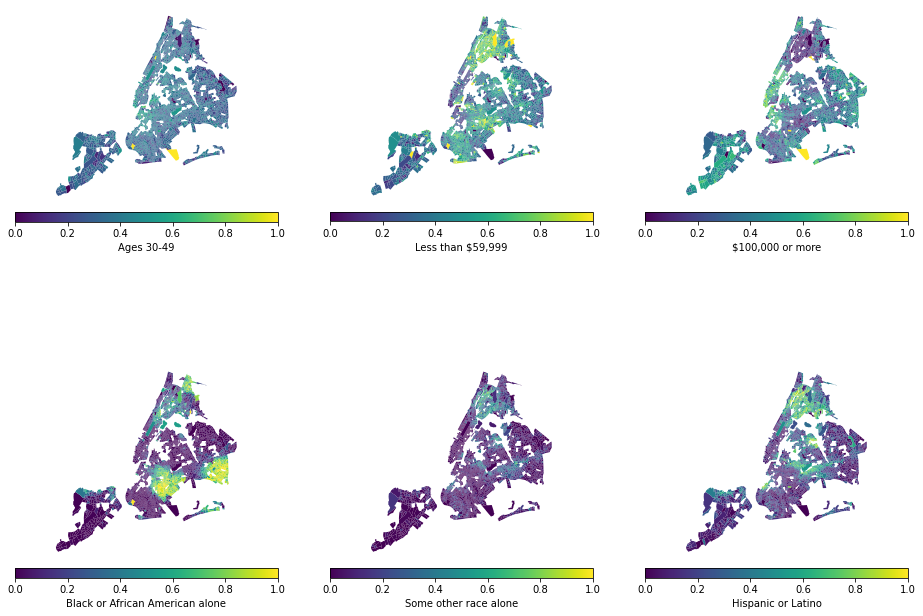

In [ ]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

fig, ax = plt.subplots(2,3, figsize=(16, 12))


pos_frac_columns = {'B01P3049_frac':'Ages 30-49',
                    'B19xxx59_frac':'Less than $59,999',
                    'B19100xx_frac':'$100,000 or more',
                    'B02001e3_frac':'Black or African American alone', 
                    'B02001e7_frac':'Some other race alone', 
                    'B03003e3_frac':'Hispanic or Latino'}


# df_demo.plot(column='B01P3049_frac', ax=ax, legend=True, legend_kwds={'label': 'Ages 30-49', 'orientation':'horizontal'});
for i, (column, label) in enumerate(pos_frac_columns.items()):
  new_ax = ax[i // 3][i % 3]
  divider = make_axes_locatable(new_ax)
  cax = divider.append_axes("bottom", size="5%", pad=0.1)
  df_demo.plot(column=column, ax=new_ax, legend=True, legend_kwds={'label': label, 'orientation':'horizontal'}, cax=cax);
  new_ax.axis('off')

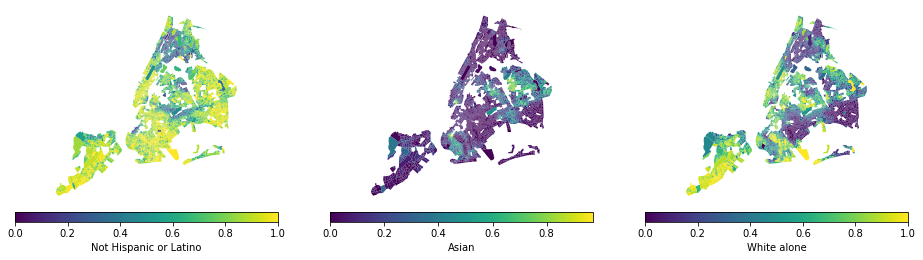

In [ ]:


neg_frac_columns = {'B03003e2_frac':'Not Hispanic or Latino',
                    'B02001e5_frac':'Asian', 
                    'B02001e2_frac':'White alone'}

fig, ax = plt.subplots(1,3, figsize=(16, 12))


for i, (column, label) in enumerate(neg_frac_columns.items()):
  divider = make_axes_locatable(ax[i])
  cax = divider.append_axes("bottom", size="5%", pad=0.1)
  df_demo.plot(column=column, ax=ax[i], legend=True, legend_kwds={'label': label, 'orientation':'horizontal'},cax=cax);
  ax[i].axis('off')

In [ ]:
# cbg 360470066002
cbg_360470066002 = df_all[df_all['visitor_home_cbg'] == '360470066002']
for k, v in pos_frac_columns.items():
  print(v)
  print(cbg_360470066002[k])
  print()
for k, v in neg_frac_columns.items():
  print(v)
  print(cbg_360470066002[k])
  print()

Ages 30-49
1164   0.24
Name: B01P3049_frac, dtype: float64

Less than $59,999
1164   0.44
Name: B19xxx59_frac, dtype: float64

$100,000 or more
1164   0.30
Name: B19100xx_frac, dtype: float64

Black or African American alone
1164   0.01
Name: B02001e3_frac, dtype: float64

Some other race alone
1164   0.04
Name: B02001e7_frac, dtype: float64

Hispanic or Latino
1164   0.25
Name: B03003e3_frac, dtype: float64

Not Hispanic or Latino
1164   0.75
Name: B03003e2_frac, dtype: float64

Asian
1164   0.02
Name: B02001e5_frac, dtype: float64

White alone
1164   0.83
Name: B02001e2_frac, dtype: float64



In [ ]:
# cbg 360610032002
cbg_360610032002 = df_all[df_all['visitor_home_cbg'] == '360610032002']
for k, v in pos_frac_columns.items():
  print(v)
  print(cbg_360610032002[k])
  print()
for k, v in neg_frac_columns.items():
  print(v)
  print(cbg_360610032002[k])
  print()

Ages 30-49
3051   0.17
Name: B01P3049_frac, dtype: float64

Less than $59,999
3051   0.32
Name: B19xxx59_frac, dtype: float64

$100,000 or more
3051   0.61
Name: B19100xx_frac, dtype: float64

Black or African American alone
3051   0.00
Name: B02001e3_frac, dtype: float64

Some other race alone
3051   0.00
Name: B02001e7_frac, dtype: float64

Hispanic or Latino
3051   0.02
Name: B03003e3_frac, dtype: float64

Not Hispanic or Latino
3051   0.98
Name: B03003e2_frac, dtype: float64

Asian
3051   0.12
Name: B02001e5_frac, dtype: float64

White alone
3051   0.88
Name: B02001e2_frac, dtype: float64



## Look at the effect size, why?

Because a high sample size lowers p-value. This means that something not significant may be concluded as significant.

In [ ]:
from sklearn import cluster
# import pysal as ps
from sklearn.preprocessing import scale

#Folium

In [ ]:
import folium

prepandemic_exploded_df_merged_with_df_cc.columns

Index(['placekey', 'visitor_home_cbg', 'raw_visit_counts', 'geoid',
       'v_countyfips', 'v_lat', 'v_lon', 'v_geometry', 'location_name',
       'brands', 'h_latitude', 'h_longitude', 'h_region', 'h_postal_code',
       'distance_from_home', 'h_poicbg', 'h_coor', 'v_coor', 'distance'],
      dtype='object')

In [ ]:
df_p = prepandemic_exploded_df_merged_with_df_cc[['h_latitude', 'h_longitude', 'location_name']].copy().drop_duplicates()
df_d = duringpandemic_exploded_df_merged_with_df_cc[['h_latitude', 'h_longitude', 'location_name']].copy().drop_duplicates()

In [ ]:
df_visited_during = df_p.merge(df_d, how='left', indicator=True)
df = df_visited_during[df_visited_during['_merge'] == 'left_only']
map = folium.Map(location=[df.h_latitude.mean(), df.h_longitude.mean()], zoom_start=12, control_scale=True)
for index, location_info in df.iterrows():
  folium.CircleMarker([location_info["h_latitude"], location_info["h_longitude"]], radius=2, color='black', fill_color='red', fill_opacity = 0.08).add_to(map)
map

In [ ]:
def folium_map(df, color):
  map = folium.Map(location=[df.h_latitude.mean(), df.h_longitude.mean()], zoom_start=12, control_scale=True)
  for index, location_info in df.iterrows():
    folium.CircleMarker([location_info["h_latitude"], location_info["h_longitude"]], radius=2, color=color, fill_color=color, fill_opacity = 0.08).add_to(map)
  return map

In [ ]:
folium_map(prepandemic_exploded_df_merged_with_df_cc[['h_latitude', 'h_longitude', 'location_name']].copy().drop_duplicates(), 'blue')

In [ ]:
folium_map(duringpandemic_exploded_df_merged_with_df_cc[['h_latitude', 'h_longitude', 'location_name']].copy().drop_duplicates(), 'red')